# MULTI LABEL PROJECT

## BUILD THE DATASET

In [1]:
import pandas as pd
import numpy as np
import tensorflow as tf
import os
import random as rn
from os.path import join, getsize
from tensorflow.keras import layers
from tensorflow.keras import models
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, Callback
from sklearn.preprocessing import MultiLabelBinarizer
import matplotlib.pyplot as plt
import matplotlib.style as style
from PIL import Image
from tqdm import tqdm

In [2]:
# The below is necessary for reproducible results of certain Python hash-based operations.
os.environ["PYTHONHASHSEED"]="0"

# The below is necessary for starting Numpy generated random numbers in a well-defined initial state.
np.random.seed(31)

# The below is necessary for starting core Python generated random numbers in a well-defined state.
rn.seed(14)

# The below tf.random.set_seed will make random number generation in TensorFlow have a well-defined initial state.
tf.random.set_seed(1234)

In [3]:
df = pd.read_csv("./artemis_official_data/official_data/artemis_dataset_release_v0.csv")

df = df.sort_values(by=['art_style'])

df = df.drop(['utterance','repetition'], axis=1)


df

,art_style,painting,emotion
228833,Abstract_Expressionism,brice-marden_joined-2011,contentment
17344,Abstract_Expressionism,louise-nevelson_sky-covenant-1973,contentment
17339,Abstract_Expressionism,mark-rothko_untitled-14b,amusement
17338,Abstract_Expressionism,kenzo-okada_white-and-brown-1972,contentment
58772,Abstract_Expressionism,jimmy-ernst_four-days-1979,contentment
...,...,...,...
197704,Ukiyo_e,kitagawa-utamaro_a-scene-on-the-bridge-and-beld-2,contentment
59050,Ukiyo_e,utagawa-toyokuni-ii_view-of-oshima-from-atami-...,contentment
135984,Ukiyo_e,ogata-gekko_nihon-hana-zue-1897-2,contentment
59035,Ukiyo_e,utagawa-kuniyoshi_woman-under-a-cherry-tree,disgust


<AxesSubplot: >

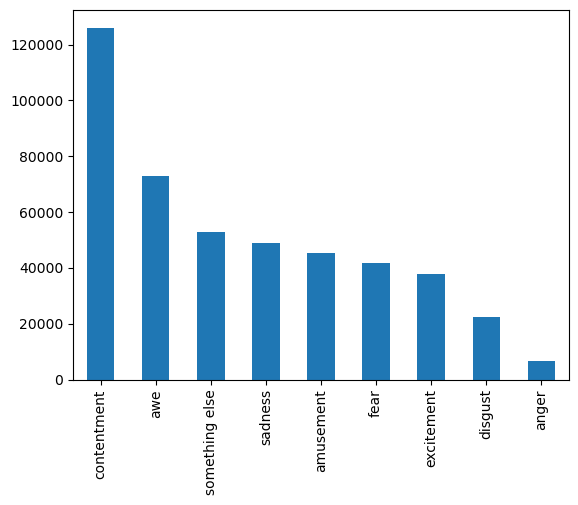

In [4]:
df['emotion'].value_counts().plot(kind='bar')

In [5]:
df = df.groupby(['art_style','painting'])['emotion'].apply(list).map(pd.unique).reset_index(name='emotions')#.reset_index(name='emotions')
#df = df.emotions.map(pd.unique)
df['emotions'] = df['emotions'].apply(lambda x: list(x))
#df = df.loc[(df['art_style'] == 'Abstract_Expressionism') | (df['art_style'] == 'Impressionism')]
df['emotions']

0           [something else, amusement, fear, contentment]
1        [contentment, sadness, fear, something else, awe]
2                                   [fear, something else]
3                   [something else, disgust, contentment]
4                                   [something else, fear]
                               ...                        
80026                  [awe, contentment, amusement, fear]
80027        [contentment, amusement, excitement, disgust]
80028                   [contentment, sadness, excitement]
80029                   [awe, contentment, something else]
80030                   [contentment, something else, awe]
Name: emotions, Length: 80031, dtype: object

<AxesSubplot: >

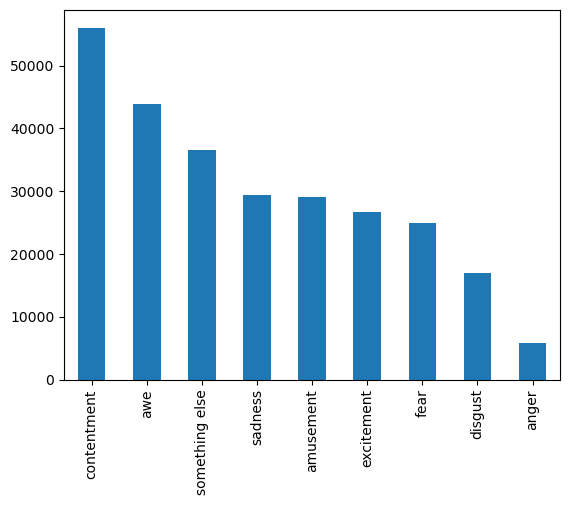

In [6]:
df_ex = df.explode('emotions')

df_ex['emotions'].value_counts().plot(kind='bar')

In [7]:
#df_paint = pd.DataFrame(columns=['art_style','painting','path'])
rows_df = []
for root, dirs, files in os.walk('./wikiart/'):
    if not dirs:
        for file in files:
            art_style = root.split(sep='/')[2]
            path = root + '/' + file
            painting = file.replace('.jpg', '')
            rows_df.append([art_style, painting, path])


df_paint = pd.DataFrame(rows_df,columns=['art_style','painting','path'])
df_paint

,art_style,painting,path
0,Abstract_Expressionism,aaron-siskind_acolman-1-1955,./wikiart/Abstract_Expressionism/aaron-siskind...
1,Abstract_Expressionism,aaron-siskind_chicago-1951,./wikiart/Abstract_Expressionism/aaron-siskind...
2,Abstract_Expressionism,aaron-siskind_chicago-6-1961,./wikiart/Abstract_Expressionism/aaron-siskind...
3,Abstract_Expressionism,aaron-siskind_feet-102-1957,./wikiart/Abstract_Expressionism/aaron-siskind...
4,Abstract_Expressionism,aaron-siskind_gloucester-16a-1944,./wikiart/Abstract_Expressionism/aaron-siskind...
...,...,...,...
81439,Ukiyo_e,utagawa-toyokuni_the-actor-otani-monzo-in-the-...,./wikiart/Ukiyo_e/utagawa-toyokuni_the-actor-o...
81440,Ukiyo_e,utagawa-toyokuni_the-heian-courtier,./wikiart/Ukiyo_e/utagawa-toyokuni_the-heian-c...
81441,Ukiyo_e,utagawa-toyokuni_the-promenade,./wikiart/Ukiyo_e/utagawa-toyokuni_the-promena...
81442,Ukiyo_e,utagawa-toyokuni_three-beauties-playing-battle...,./wikiart/Ukiyo_e/utagawa-toyokuni_three-beaut...


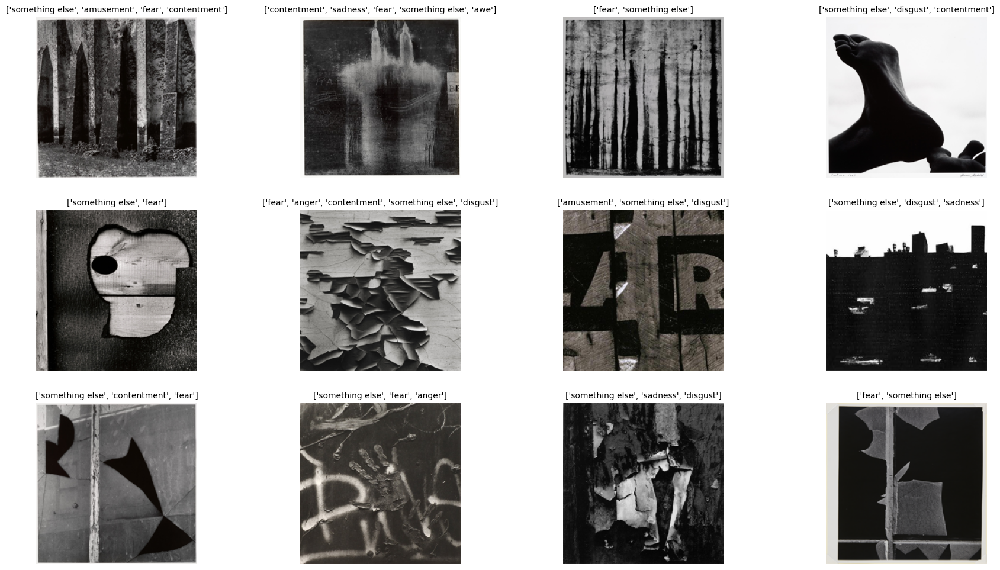

In [8]:


nobs = 12 # Maximum number of images to display
ncols = 4 # Number of columns in display
nrows = nobs//ncols # Number of rows in display

X_train = df_paint['path']
y_train = df['emotions']

style.use("default")
plt.figure(figsize=(22,4*nrows))
for i in range(nrows*ncols):
    ax = plt.subplot(nrows, ncols, i+1)
    plt.imshow(Image.open(X_train[i]).resize((224,224)))
    plt.title(y_train[i], size=10)
    plt.axis('off')

In [9]:
df_complete = pd.merge(df, df_paint,  how='left', left_on=['art_style','painting'], right_on = ['art_style','painting'])

df_complete

,art_style,painting,emotions,path
0,Abstract_Expressionism,aaron-siskind_acolman-1-1955,"[something else, amusement, fear, contentment]",./wikiart/Abstract_Expressionism/aaron-siskind...
1,Abstract_Expressionism,aaron-siskind_chicago-1951,"[contentment, sadness, fear, something else, awe]",./wikiart/Abstract_Expressionism/aaron-siskind...
2,Abstract_Expressionism,aaron-siskind_chicago-6-1961,"[fear, something else]",./wikiart/Abstract_Expressionism/aaron-siskind...
3,Abstract_Expressionism,aaron-siskind_feet-102-1957,"[something else, disgust, contentment]",./wikiart/Abstract_Expressionism/aaron-siskind...
4,Abstract_Expressionism,aaron-siskind_gloucester-16a-1944,"[something else, fear]",./wikiart/Abstract_Expressionism/aaron-siskind...
...,...,...,...,...
80026,Ukiyo_e,utagawa-toyokuni_the-actor-otani-monzo-in-the-...,"[awe, contentment, amusement, fear]",./wikiart/Ukiyo_e/utagawa-toyokuni_the-actor-o...
80027,Ukiyo_e,utagawa-toyokuni_the-heian-courtier,"[contentment, amusement, excitement, disgust]",./wikiart/Ukiyo_e/utagawa-toyokuni_the-heian-c...
80028,Ukiyo_e,utagawa-toyokuni_the-promenade,"[contentment, sadness, excitement]",./wikiart/Ukiyo_e/utagawa-toyokuni_the-promena...
80029,Ukiyo_e,utagawa-toyokuni_three-beauties-playing-battle...,"[awe, contentment, something else]",./wikiart/Ukiyo_e/utagawa-toyokuni_three-beaut...


In [10]:
#df_complete.to_csv("./wikiart/complete_dataset.csv", index=False)
null_data = df_complete[df_complete.isnull().any(axis=1)]
null_data

,art_style,painting,emotions,path
11298,Baroque,rembrandt_woman-standing-with-raised-hands,"[sadness, something else, amusement, contentment]",NaN


In [11]:
#df = pd.read_csv('./wikiart/complete_dataset.csv', index_col=None, header=0,sep=',')
#df
df_complete = df_complete.dropna()


In [12]:
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(df_complete['path'], df_complete['emotions'], train_size=0.7, random_state=44)
X_val, X_test, y_val, y_test = train_test_split(X_val, y_val, train_size=0.5, random_state=44)
print("Number of paint for training: ", len(X_train))
print("Number of paint for validation: ", len(X_val))
print("Number of paint for validation: ", len(X_test))

Number of paint for training:  56021
Number of paint for validation:  12004
Number of paint for validation:  12005


In [13]:
X_train = [os.path.join('',str(f)) for f in X_train]
X_val = [os.path.join('',str(f)) for f in X_val]
X_test = [os.path.join('',str(f)) for f in X_test]
X_train

['./wikiart/Art_Nouveau_Modern/heorhiy-narbut_galicia-governorate-coat-of-arms-1914.jpg',
 './wikiart/Impressionism/mary-cassatt_susan-comforting-the-baby-no-1.jpg',
 './wikiart/Art_Nouveau_Modern/felix-vallotton_portrait-of-french-writer-douard-dujardin-1898.jpg',
 './wikiart/Realism/vincent-van-gogh_peasant-seen-from-the-back-and-three-hands-holding-a-stick-1885.jpg',
 './wikiart/Realism/volodymyr-orlovsky_summer-day-in-ukraine-1892.jpg',
 './wikiart/Rococo/jean-baptiste-simeon-chardin_still-life-with-turkey-hanged.jpg',
 './wikiart/Contemporary_Realism/jamie-wyeth_not-detected-267443.jpg',
 './wikiart/Impressionism/janos-tornyai_farm-with-shadoof-1907.jpg',
 './wikiart/Romanticism/konstantin-makovsky_head.jpg',
 './wikiart/High_Renaissance/raphael_self-portrait-1.jpg',
 './wikiart/Realism/thomas-eakins_gears.jpg',
 './wikiart/Post_Impressionism/panayiotis-tetsis_slain-1955.jpg',
 './wikiart/Realism/martiros-saryan_church-karmravor-of-vii-century-1956.jpg',
 './wikiart/Post_Impressio

In [14]:
y_train = list(y_train)
y_val = list(y_val)
y_test = list(y_test)
y_train

[['sadness', 'amusement', 'something else', 'awe'],
 ['amusement', 'sadness', 'awe'],
 ['amusement', 'contentment', 'anger', 'something else'],
 ['disgust', 'sadness', 'fear', 'amusement', 'contentment'],
 ['awe', 'contentment', 'something else'],
 ['disgust', 'awe', 'sadness'],
 ['sadness', 'awe', 'fear', 'contentment'],
 ['sadness', 'excitement', 'contentment'],
 ['contentment', 'excitement'],
 ['sadness', 'awe', 'amusement', 'contentment'],
 ['amusement', 'something else', 'awe', 'contentment'],
 ['disgust', 'something else'],
 ['excitement', 'contentment', 'awe'],
 ['contentment', 'something else', 'disgust'],
 ['something else', 'contentment', 'awe'],
 ['disgust', 'awe', 'contentment', 'something else'],
 ['sadness', 'awe', 'contentment', 'excitement', 'amusement'],
 ['amusement', 'contentment', 'awe', 'sadness'],
 ['sadness', 'contentment'],
 ['sadness', 'fear', 'awe', 'contentment'],
 ['fear', 'awe', 'amusement'],
 ['excitement', 'contentment', 'sadness', 'something else'],
 ['a

In [15]:


print("Labels:")
mlb = MultiLabelBinarizer()
mlb.fit(y_train)

# Loop over all labels and show them
N_LABELS = len(mlb.classes_)
for (i, label) in enumerate(mlb.classes_):
    print("{}. {}".format(i, label))

Labels:
0. amusement
1. anger
2. awe
3. contentment
4. disgust
5. excitement
6. fear
7. sadness
8. something else


In [16]:
y_train_bin = mlb.transform(y_train)
y_val_bin = mlb.transform(y_val)
y_test_bin = mlb.transform(y_test)

for i in range(3):
    print(X_test[i], y_test_bin[i])

./wikiart/Realism/boris-kustodiev_a-soldier-with-a-rifle-1917.jpg [0 1 0 0 0 1 1 0 0]
./wikiart/Art_Nouveau_Modern/frank-johnston_moose-pond-1918.jpg [0 0 0 1 0 1 0 0 0]
./wikiart/Fauvism/georges-braque_antwerp-harbor-1905.jpg [0 0 1 1 0 1 0 0 0]


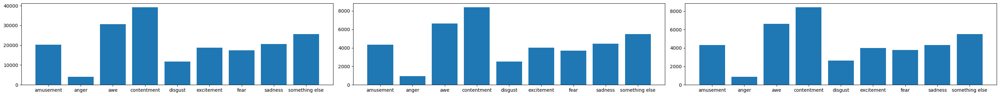

In [17]:
total_distribution_train = np.zeros(9)
total_distribution_val = np.zeros(9)
total_distribution_test = np.zeros(9)

for label in y_train_bin:
    total_distribution_train = np.add(total_distribution_train, label)

for label in y_val_bin:
    total_distribution_val = np.add(total_distribution_val, label)

for label in y_test_bin:
    total_distribution_test = np.add(total_distribution_test, label)

#total_distribution_train
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(30, 3))
axes[0].bar(mlb.classes_,total_distribution_train, align='center')
axes[1].bar(mlb.classes_,total_distribution_val, align='center')
axes[2].bar(mlb.classes_,total_distribution_test, align='center')

fig.tight_layout()


In [26]:
y_train
list_indeces = []

for i, labels in enumerate(y_train):
    if 'anger' in labels and len(labels) < 3:
        list_indeces.append(i)
        print(labels)
        #plt.imshow(Image.open(X_train[i]).resize((224,224)))
        


len(list_indeces)

['fear', 'anger']
['fear', 'anger']
['sadness', 'anger']
['fear', 'anger']
['excitement', 'anger']
['something else', 'anger']
['amusement', 'anger']
['anger', 'contentment']
['contentment', 'anger']
['awe', 'anger']
['contentment', 'anger']
['fear', 'anger']
['fear', 'anger']
['excitement', 'anger']
['something else', 'anger']
['anger', 'fear']
['fear', 'anger']
['contentment', 'anger']
['fear', 'anger']
['fear', 'anger']
['amusement', 'anger']
['fear', 'anger']
['sadness', 'anger']
['something else', 'anger']
['anger', 'sadness']
['something else', 'anger']
['anger', 'something else']
['something else', 'anger']
['fear', 'anger']
['fear', 'anger']
['contentment', 'anger']
['fear', 'anger']
['anger', 'fear']
['amusement', 'anger']
['sadness', 'anger']
['fear', 'anger']
['anger', 'disgust']
['anger', 'awe']
['something else', 'anger']
['fear', 'anger']
['anger', 'disgust']
['something else', 'anger']
['contentment', 'anger']
['fear', 'anger']
['anger', 'sadness']
['fear', 'anger']
['aw

102

In [18]:
import tensorflow as tf
IMG_SIZE = 224
CHANNELS = 3
BATCH_SIZE = 64
AUTOTUNE = tf.data.experimental.AUTOTUNE
SHUFFLE_BUFFER_SIZE = 128


In [19]:
def image_preprocessing(file, label):
    img = tf.io.read_file(file)
    #print('Print immagine: ')
    #print(img)
    img_dec = tf.image.decode_jpeg(img, channels=CHANNELS)
    #print('Print immagine decodificata: ')
    #print(img_dec)
    img_resize = tf.image.resize(img_dec, [IMG_SIZE, IMG_SIZE])
    #print('Print immagine Resize: ')
    #print(img_resize)
    img_normalized = img_resize#/255.0
    #print('Print immagine normalize: ')
    #print(img_normalized)
    return img_normalized, label

In [20]:
def create_dataset(filenames, labels, is_training=True):
   
    dataset = tf.data.Dataset.from_tensor_slices((filenames, labels))
    # Parse and preprocess observations in parallel
    
    dataset = dataset.map(image_preprocessing, num_parallel_calls=AUTOTUNE)
    #print(dataset)
    if is_training == True:
        # This is a small dataset, only load it once, and keep it in memory.
        #dataset = dataset.cache()
        # Shuffle the data each buffer size
        dataset = dataset.shuffle(buffer_size=SHUFFLE_BUFFER_SIZE)
        
    # Batch the data for multiple steps
    dataset = dataset.batch(BATCH_SIZE)
    # Fetch batches in the background while the model is training.
    dataset = dataset.prefetch(buffer_size=AUTOTUNE)
    
    return dataset

In [21]:
train_ds = create_dataset(X_train, y_train_bin)
val_ds = create_dataset(X_val, y_val_bin)
test_ds = create_dataset(X_test, y_test_bin)

#for (i, (f, l)) in enumerate(train_ds):
#    if i < 3:
#        print('Immagine: ')
#        print(f)
#
#        print('Label: ')
#        print(l)
#    else:
#        break

In [22]:
N=len(X_train) #+ len(X_val) + len(X_test)
class_weights = {}
positive_weights = {}
negative_weights = {}

for (i, label) in enumerate(mlb.classes_):
    sum_positive = 0
    sum_negative = 0
    for labels in y_train_bin:
        if labels[i] == 1:
            sum_positive += 1
        else:
            sum_negative += 1

    positive_weights[label] = N /(2 * sum_positive)
    negative_weights[label] = N /(2 * sum_negative)


    
class_weights['positive_weights'] = positive_weights
class_weights['negative_weights'] = negative_weights
class_weights

{'positive_weights': {'amusement': 1.3771817690151924,
  'anger': 6.895741014278681,
  'awe': 0.9141808093994778,
  'contentment': 0.7140799469739458,
  'disgust': 2.374576127500848,
  'excitement': 1.495807967531774,
  'fear': 1.6044506816359263,
  'sadness': 1.3633730834752982,
  'something else': 1.0942456441909525},
 'negative_weights': {'amusement': 0.7850036432935373,
  'anger': 0.5390885120960758,
  'awe': 1.103601118947244,
  'contentment': 1.6677880321524263,
  'disgust': 0.6333634821933296,
  'excitement': 0.7510524198954284,
  'fear': 0.7263568705754221,
  'sadness': 0.789561957379637,
  'something else': 0.9207014429872136}}

In [23]:
from tensorflow.keras import backend as K


@tf.function
def macro_soft_f1(y, y_hat):
    """Compute the macro soft F1-score as a cost (average 1 - soft-F1 across all labels).
    Use probability values instead of binary predictions.
    
    Args:
        y (int32 Tensor): targets array of shape (BATCH_SIZE, N_LABELS)
        y_hat (float32 Tensor): probability matrix from forward propagation of shape (BATCH_SIZE, N_LABELS)
        
    Returns:
        cost (scalar Tensor): value of the cost function for the batch
    """
    y = tf.cast(y, tf.float32)
    y_hat = tf.cast(y_hat, tf.float32)
    tp = tf.reduce_sum(y_hat * y, axis=0)
    fp = tf.reduce_sum(y_hat * (1 - y), axis=0)
    fn = tf.reduce_sum((1 - y_hat) * y, axis=0)
    soft_f1 = 2*tp / (2*tp + fn + fp + 1e-16)
    cost = 1 - soft_f1 # reduce 1 - soft-f1 in order to increase soft-f1
    macro_cost = tf.reduce_mean(cost) # average on all labels
    return macro_cost


@tf.function
def macro_f1(y, y_hat, thresh=0.5):
    """Compute the macro F1-score on a batch of observations (average F1 across labels)
    
    Args:
        y (int32 Tensor): labels array of shape (BATCH_SIZE, N_LABELS)
        y_hat (float32 Tensor): probability matrix from forward propagation of shape (BATCH_SIZE, N_LABELS)
        thresh: probability value above which we predict positive
        
    Returns:
        macro_f1 (scalar Tensor): value of macro F1 for the batch
    """
    y_pred = tf.cast(tf.greater(y_hat, thresh), tf.float32)
    tp = tf.cast(tf.math.count_nonzero(y_pred * y, axis=0), tf.float32)
    fp = tf.cast(tf.math.count_nonzero(y_pred * (1 - y), axis=0), tf.float32)
    fn = tf.cast(tf.math.count_nonzero((1 - y_pred) * y, axis=0), tf.float32)
    f1 = 2*tp / (2*tp + fn + fp + 1e-16)
    macro_f1 = tf.reduce_mean(f1)
    return macro_f1


Wp = class_weights['positive_weights']
Wn = class_weights['negative_weights']


def custom_loss(y_true, y_logit):
    '''
    Multi-label cross-entropy
    * Required "Wp", "Wn" as positive & negative class-weights
    y_true: true value
    y_logit: predicted value
    '''
    loss = float(0.0)
    
    for i, key in enumerate(Wp.keys()):
        #print(Wp[key])
        #print(tf.cast(y_true[i], tf.float32))
        #print(y_logit[i])
        first_term = Wp[key] * tf.cast(y_true[i], tf.float32) * K.log(y_logit[i] + K.epsilon())
        second_term = Wn[key] * (1 - tf.cast(y_true[i], tf.float32)) * K.log(1 - y_logit[i] + K.epsilon())
        loss -= (first_term + second_term)
    return loss

def f1_score(y_true, y_logit):
    '''
    Calculate F1 score
    y_true: true value
    y_logit: predicted value
    '''
    true_positives = K.sum(K.round(K.clip(y_true * y_logit, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    recall = true_positives / (possible_positives + K.epsilon())
    predicted_positives = K.sum(K.round(K.clip(y_logit, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    return (2 * precision * recall) / (precision + recall + K.epsilon())

In [24]:
#from utils import *
def plot_accuracy_and_loss(history):
  """ Plot graph of accuracy and loss given the training history as parameter."""
  
  acc = history.history['accuracy']
  val_acc = history.history['val_accuracy']
  
  macro_f1 = history.history['macro_f1']
  val_macro_f1 = history.history['val_macro_f1']

  f1 = history.history['f1_score']
  val_f1 = history.history['val_f1_score']

  loss = history.history['loss']
  val_loss = history.history['val_loss']

  plt.figure(figsize=(8, 8))
  plt.subplot(2, 2, 1)
  plt.plot(acc, label='Training Accuracy')
  plt.plot(val_acc, label='Validation Accuracy')
  plt.legend(loc='upper right')
  plt.ylabel('Accuracy')
  plt.ylim([min(plt.ylim()),1])
  plt.title('Training and Validation Accuracy')

  
  plt.subplot(2, 2, 2)
  plt.plot(macro_f1, label='Training Macro f1')
  plt.plot(val_macro_f1, label='Validation Macro f1')
  plt.legend(loc='upper right')
  plt.ylabel('Macro F1')
  plt.ylim([min(plt.ylim()),1])
  plt.title('Training and Validation Macro F1')
  
  plt.subplot(2, 2, 3)
  plt.plot(f1, label='Training F1')
  plt.plot(val_f1, label='Validation F1 score')
  plt.legend(loc='upper right')
  plt.ylabel('F1 Score')
  plt.ylim([min(plt.ylim()),1])
  plt.title('Training and Validation F1 score')

  plt.subplot(2, 2, 4)
  plt.plot(loss, label='Training Loss')
  plt.plot(val_loss, label='Validation Loss')
  plt.legend(loc='upper right')
  plt.ylabel('Cross Entropy')
  #plt.ylim([0,1.0])
  plt.title('Training and Validation Loss')
  plt.xlabel('epoch')
  plt.show()

from keras.preprocessing import image

def show_prediction(path, emotions, model_load):
    
    # Get movie info
    #imdbId = movies.loc[movies['Title']==title]['imdbId'].iloc[0]
    #genre = movies.loc[movies['Title']==title]['Genre'].iloc[0]
    img_path = os.path.join(path)

    # Read and prepare image
    img = image.load_img(img_path, target_size=(IMG_SIZE,IMG_SIZE,CHANNELS))
    img = image.img_to_array(img)
    img = img#/255.0
    print('Img to array')
    #print(img)
    img = np.expand_dims(img, axis=0)
    print('Expand')
    #print(img)

    # Generate prediction
    print(model_load.predict(img))
    prediction = (model_load.predict(img) > 0.5).astype('int')
    prediction = pd.Series(prediction[0])
    prediction.index = mlb.classes_
    prediction = prediction[prediction==1].index.values

    # Dispaly image with prediction
    style.use('default')
    plt.figure(figsize=(8,4))
    plt.imshow(Image.open(img_path))
    plt.title('\n\n{}\n\nEmotions\n{}\n\nPrediction\n{}\n'.format(path, list(dict.fromkeys(emotions)), list(prediction)), fontsize=9)
    plt.show()

## MODEL FROM SCRATCH

In [207]:
model_m = models.Sequential()

model_m.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)))
#model_m.add(layers.Rescaling(1./255))
model_m.add(layers.MaxPooling2D((2, 2)))
model_m.add(layers.Conv2D(64, (3, 3), activation='relu'))
model_m.add(layers.MaxPooling2D((2, 2)))
model_m.add(layers.Conv2D(128, (3, 3), activation='relu'))
model_m.add(layers.MaxPooling2D((2, 2)))
model_m.add(layers.Conv2D(256, (3, 3), activation='relu', padding='same'))
model_m.add(layers.Conv2D(256, (3, 3), activation='relu', padding='same'))
model_m.add(layers.MaxPooling2D((2, 2)))
model_m.add(layers.Conv2D(512, (3, 3), activation='relu'))
model_m.add(layers.Conv2D(512, (3, 3), activation='relu', padding='same'))
model_m.add(layers.Conv2D(512, (3, 3), activation='relu', padding='same'))
model_m.add(layers.MaxPooling2D((2, 2)))
model_m.add(layers.Conv2D(1024, (3, 3), activation='relu'))
model_m.add(layers.Conv2D(1024, (3, 3), activation='relu', padding='same'))
model_m.add(layers.Conv2D(1024, (3, 3), activation='relu', padding='same'))
#model_m.add(layers.MaxPooling2D((2, 2)))
#model_m.add(layers.Conv2D(2048, (3, 3), activation='relu'))
model_m.add(layers.Flatten())
model_m.add(layers.Dropout(0.2))
model_m.add(layers.Dense(N_LABELS, activation='sigmoid'))

#model_m.summary()

In [208]:
from sklearn.utils import class_weight

earlystopping = EarlyStopping(monitor='val_loss', mode='min', patience=5, verbose=1)

checkpoint = ModelCheckpoint('./model_1024_custom_loss_f1_2.h5',   
        monitor='val_loss', mode='min', verbose=1, 
        save_best_only=True, save_freq='epoch'
)

model_m.compile(
    optimizer=tf.keras.optimizers.RMSprop(1e-6),#tf.keras.optimizers.SGD(learning_rate=1e-4, momentum=0.9),#tf.keras.optimizers.Adam(learning_rate=2e-4),
    loss= #macro_soft_f1,
          #custom_loss,
          tf.keras.metrics.binary_crossentropy,
          #tf.nn.weighted_cross_entropy_with_logits,
  metrics=['accuracy',macro_f1, f1_score])

weights ={} 

#max_value = max(weights.values())
for index, val in enumerate(Wp):
        weights[index] = Wp[val]# / max_value


weights

{0: 1.3771817690151924,
 1: 6.895741014278681,
 2: 0.9141808093994778,
 3: 0.7140799469739458,
 4: 2.374576127500848,
 5: 1.495807967531774,
 6: 1.6044506816359263,
 7: 1.3633730834752982,
 8: 1.0942456441909525}

In [209]:
history = model_m.fit(train_ds,
                        epochs= 10,
                        #batch_size=64,
                        validation_data=val_ds,
                        verbose=1,
                        class_weight=weights, #da togliere
                        callbacks=[earlystopping]) # ho tolto il checkppoint, reinserirlo dopo che ho finito di fare alcuni test

Epoch 1/10
876/876 [==============================] - 170s 180ms/step - loss: 0.8895 - accuracy: 0.1749 - macro_f1: 0.1701 - f1_score: 0.4389 - val_loss: 0.6122 - val_accuracy: 0.1734 - val_macro_f1: 0.1702 - val_f1_score: 0.4661
Epoch 2/10
876/876 [==============================] - 156s 178ms/step - loss: 0.8757 - accuracy: 0.1777 - macro_f1: 0.1631 - f1_score: 0.4411 - val_loss: 0.6110 - val_accuracy: 0.1734 - val_macro_f1: 0.1701 - val_f1_score: 0.4658
Epoch 3/10
876/876 [==============================] - 157s 179ms/step - loss: 0.8746 - accuracy: 0.1777 - macro_f1: 0.1630 - f1_score: 0.4409 - val_loss: 0.6097 - val_accuracy: 0.1734 - val_macro_f1: 0.1700 - val_f1_score: 0.4658
Epoch 4/10
876/876 [==============================] - 148s 168ms/step - loss: 0.8734 - accuracy: 0.1777 - macro_f1: 0.1636 - f1_score: 0.4420 - val_loss: 0.6099 - val_accuracy: 0.1734 - val_macro_f1: 0.1696 - val_f1_score: 0.4633
Epoch 5/10
876/876 [==============================] - 143s 163ms/step - loss: 0.

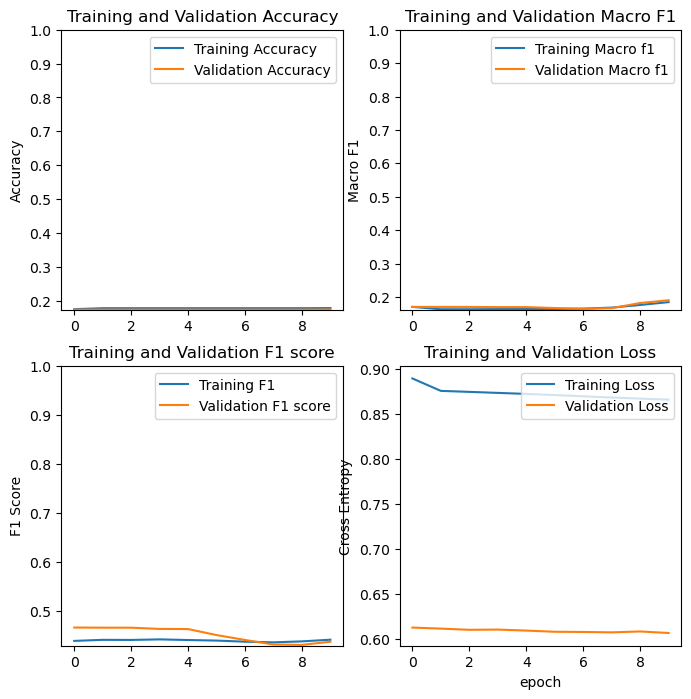

In [210]:
plot_accuracy_and_loss(history)

In [ ]:
model_loaded = tf.keras.models.load_model('./model_1024_custom_loss_f1.h5', compile=False)
model_loaded.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=5e-3),
    loss=#macro_soft_f1,
    #tf.keras.metrics.binary_crossentropy,
    custom_loss,
  metrics=['accuracy',macro_f1, f1_score])

In [211]:
#model_loaded.evaluate(test_ds) #sostituire con test_ds

model_m.evaluate(test_ds)

188/188 [==============================] - 23s 122ms/step - loss: 0.6057 - accuracy: 0.1767 - macro_f1: 0.1907 - f1_score: 0.4392


[0.6057241559028625,
 0.17667637765407562,
 0.1906583458185196,
 0.43917569518089294]

Img to array
Expand
[[0.3416797  0.21097404 0.5076024  0.66042024 0.20902112 0.31842485
  0.29065436 0.37639698 0.48608905]]


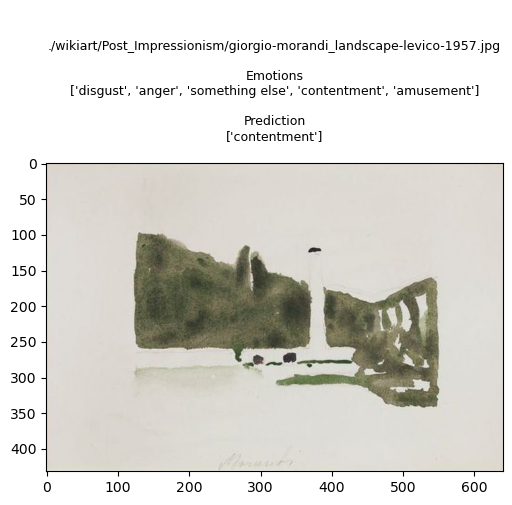

Img to array
Expand
[[0.42238614 0.30729333 0.50192535 0.5590724  0.3140001  0.3853284
  0.39458632 0.41556513 0.47910777]]


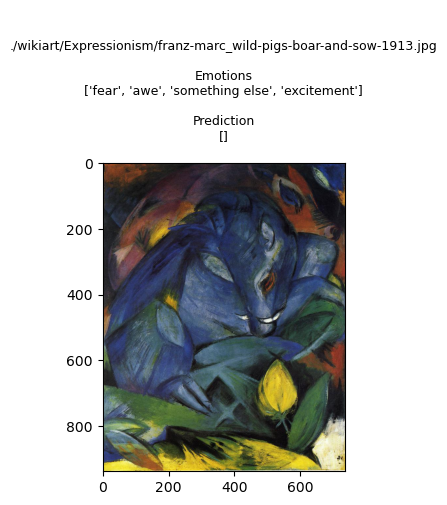

Img to array
Expand
[[0.38684818 0.28391892 0.5196636  0.62305546 0.2861086  0.3370168
  0.36942405 0.4468502  0.47661385]]


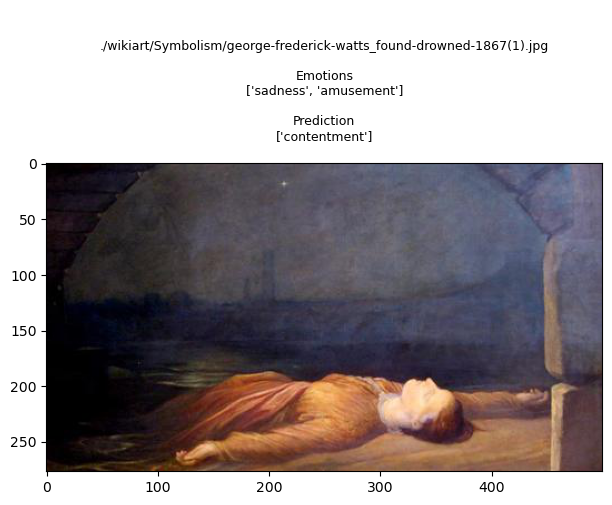

In [215]:
index= 5539
for i, path in enumerate(X_test[index:]):
    if i > 2:
        break

    show_prediction(path, y_test[i+index], model_m)#model_loaded)

## PRETRAINED MODELS

### VGG16

#### Freezed Model

In [25]:
INPUT_SHAPE = (IMG_SIZE, IMG_SIZE, 3)
base_model = tf.keras.applications.vgg16.VGG16(input_shape=INPUT_SHAPE,
        weights='imagenet',  # load the network pretrained on ImageNet1K
        include_top=False)
        
base_model.trainable = False

base_model.summary()
        

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [27]:
inputs = tf.keras.Input(shape=INPUT_SHAPE)
x = tf.keras.applications.vgg16.preprocess_input(inputs)
x = base_model(x)
x = layers.Flatten()(x)
x = layers.Dense(512)(x)
x = layers.Dropout(0.2)(x)
outputs = layers.Dense(N_LABELS, activation="sigmoid")(x)
model = tf.keras.Model(inputs, outputs)

model.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 tf.__operators__.getitem_1   (None, 224, 224, 3)      0         
 (SlicingOpLambda)                                               
                                                                 
 tf.nn.bias_add_1 (TFOpLambd  (None, 224, 224, 3)      0         
 a)                                                              
                                                                 
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 flatten_1 (Flatten)         (None, 25088)             0         
                                                                 
 dense_2 (Dense)             (None, 512)               1284

In [28]:
earlystopping = EarlyStopping(monitor='val_loss', mode='min', patience=6, verbose=1)

checkpoint = ModelCheckpoint('./pre_trained_model_no_tunining_custom_20ep_lr2.h5',   # I save in the older Keras H5 format due to a Tensorflow 2.7 bug
        monitor='val_loss', mode='min', verbose=1, 
        save_best_only=True, save_freq='epoch'
)

model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),#"rmsprop",#tf.keras.optimizers.RMSprop(learning_rate=1e-5), #tf.keras.optimizers.Adam(learning_rate=2e-4),
    loss=#macro_soft_f1,
        #tf.keras.metrics.binary_crossentropy,
        custom_loss,
  metrics=['accuracy',macro_f1, f1_score])

In [29]:
history = model.fit(train_ds,
                        epochs= 20,
                        batch_size=64,
                        validation_data=val_ds,
                        verbose=1,
                        callbacks=[earlystopping])

Epoch 1/20
876/876 [==============================] - 193s 211ms/step - loss: 45.4862 - accuracy: 0.3391 - macro_f1: 0.4706 - f1_score: 0.5689 - val_loss: 42.5717 - val_accuracy: 0.3732 - val_macro_f1: 0.4957 - val_f1_score: 0.5905
Epoch 2/20
876/876 [==============================] - 181s 206ms/step - loss: 43.6786 - accuracy: 0.3616 - macro_f1: 0.4955 - f1_score: 0.5910 - val_loss: 43.4696 - val_accuracy: 0.3655 - val_macro_f1: 0.4966 - val_f1_score: 0.5888
Epoch 3/20
876/876 [==============================] - 180s 206ms/step - loss: 42.9163 - accuracy: 0.3711 - macro_f1: 0.5055 - f1_score: 0.5969 - val_loss: 43.7113 - val_accuracy: 0.3814 - val_macro_f1: 0.4970 - val_f1_score: 0.5987
Epoch 4/20
876/876 [==============================] - 180s 205ms/step - loss: 41.8854 - accuracy: 0.3656 - macro_f1: 0.5119 - f1_score: 0.6003 - val_loss: 42.2162 - val_accuracy: 0.3346 - val_macro_f1: 0.4855 - val_f1_score: 0.5928
Epoch 5/20
876/876 [==============================] - 179s 204ms/step - 

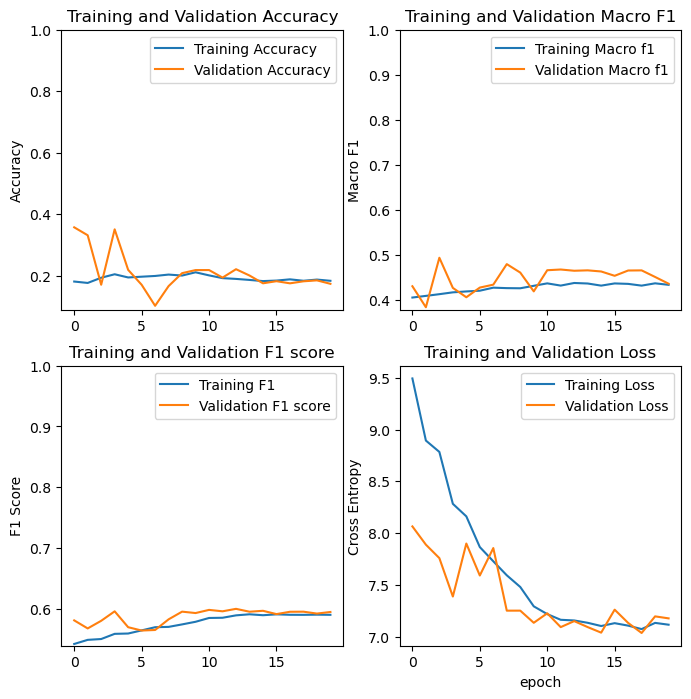

In [ ]:
plot_accuracy_and_loss(history)

In [ ]:
model_loaded = tf.keras.models.load_model('./pre_trained_model_no_tunining_custom_20ep_lr2.h5', compile=False)
model_loaded.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=2e-4),
    loss=#macro_soft_f1,
    #tf.keras.metrics.binary_crossentropy,
    custom_loss,
  metrics=['accuracy',macro_f1, f1_score])


model_loaded.evaluate(test_ds)

188/188 [==============================] - 44s 232ms/step - loss: 7.0933 - accuracy: 0.1835 - macro_f1: 0.4657 - f1_score: 0.5939


[7.093289852142334,
 0.18350687623023987,
 0.46573787927627563,
 0.5938590168952942]

In [ ]:
index = 0
for i, path in enumerate(X_test[index:]):
    if i > 2:
        break

    show_prediction(path, y_test[index+i], model_loaded)

#### FineTuning VGG16

In [ ]:
model_finetune = tf.keras.models.load_model('./pre_trained_model_no_tunining_custom_20ep.h5', compile=False)
LR = 5e-4
model_finetune.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 tf.__operators__.getitem (S  (None, 224, 224, 3)      0         
 licingOpLambda)                                                 
                                                                 
 tf.nn.bias_add (TFOpLambda)  (None, 224, 224, 3)      0         
                                                                 
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 flatten (Flatten)           (None, 25088)             0         
                                                                 
 dense (Dense)               (None, 256)               6422784   
                                                             

In [ ]:
model_finetune.trainable = True

base_model_vgg16 = model_finetune.get_layer("vgg16") # change the name looking at the summary IMPORTANT!
print("Number of layers in the base model: ", len(base_model_vgg16.layers))
base_model_vgg16.summary()

Number of layers in the base model:  19
Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPool

In [ ]:
set_trainable = False
for layer in base_model_vgg16.layers:
    if layer.name == 'block4_conv1': # è buona pratica indicare da dove si parte a sfreezare la rete
        set_trainable = True
    if set_trainable: # fine a che la variabile booleana è a False allora setto i layer non traininabili altrimenti li setto come trainabili
        layer.trainable = True
    else:
        layer.trainable = False

In [ ]:
model_finetune.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 tf.__operators__.getitem (S  (None, 224, 224, 3)      0         
 licingOpLambda)                                                 
                                                                 
 tf.nn.bias_add (TFOpLambda)  (None, 224, 224, 3)      0         
                                                                 
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 flatten (Flatten)           (None, 25088)             0         
                                                                 
 dense (Dense)               (None, 256)               6422784   
                                                             

In [ ]:
earlystopping = EarlyStopping(monitor='val_loss', mode='min', patience=6, verbose=1)

checkpoint = ModelCheckpoint('./pre_trained_model_fine_tunining_custom_20ep.h5',   # I save in the older Keras H5 format due to a Tensorflow 2.7 bug
        monitor='val_loss', mode='min', verbose=1, 
        save_best_only=True, save_freq='epoch'
)

model_finetune.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=LR),
    loss=#macro_soft_f1,
    #tf.keras.metrics.binary_crossentropy,
    custom_loss,
  metrics=['accuracy',macro_f1, f1_score]
)

In [ ]:
history_tuned = model_finetune.fit(train_ds,
                        epochs= 20,
                        batch_size=64,
                        validation_data=val_ds,
                        verbose=1,
                        callbacks=[checkpoint, earlystopping])

Epoch 1/20
876/876 [==============================] - ETA: 0s - loss: 7.2542 - accuracy: 0.1776 - macro_f1: 0.4262 - f1_score: 0.5870
Epoch 00001: val_loss improved from inf to 7.29884, saving model to .\pre_trained_model_fine_tunining_custom_20ep.h5
876/876 [==============================] - 301s 341ms/step - loss: 7.2542 - accuracy: 0.1776 - macro_f1: 0.4262 - f1_score: 0.5870 - val_loss: 7.2988 - val_accuracy: 0.1734 - val_macro_f1: 0.3582 - val_f1_score: 0.5832
Epoch 2/20
876/876 [==============================] - ETA: 0s - loss: 7.1189 - accuracy: 0.1777 - macro_f1: 0.4331 - f1_score: 0.5907
Epoch 00002: val_loss improved from 7.29884 to 7.16522, saving model to .\pre_trained_model_fine_tunining_custom_20ep.h5
876/876 [==============================] - 298s 340ms/step - loss: 7.1189 - accuracy: 0.1777 - macro_f1: 0.4331 - f1_score: 0.5907 - val_loss: 7.1652 - val_accuracy: 0.1734 - val_macro_f1: 0.4136 - val_f1_score: 0.5926
Epoch 3/20
876/876 [==============================] - ET

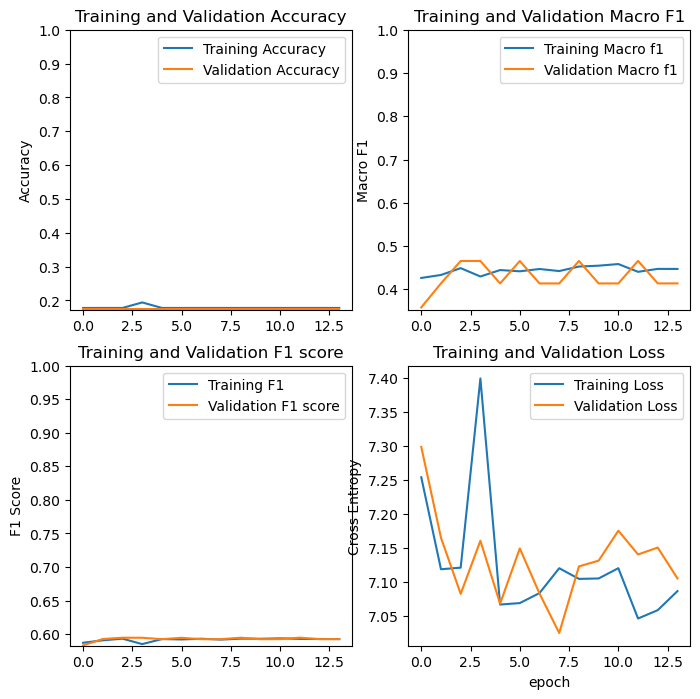

In [ ]:
plot_accuracy_and_loss(history_tuned)

In [ ]:
model_tuned_loaded = tf.keras.models.load_model('./pre_trained_model_fine_tunining_custom_20ep.h5', compile=False)
model_tuned_loaded.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=LR),
    loss=#macro_soft_f1,
    #tf.keras.metrics.binary_crossentropy,
    custom_loss,
  metrics=['accuracy',macro_f1, f1_score])


model_tuned_loaded.evaluate(test_ds)

188/188 [==============================] - 42s 219ms/step - loss: 7.1413 - accuracy: 0.1760 - macro_f1: 0.4120 - f1_score: 0.5899


[7.14130973815918,
 0.17600999772548676,
 0.41198739409446716,
 0.5898802876472473]

In [ ]:
index = 0
for i, path in enumerate(X_test[index:]):
    if i > 2:
        break

    show_prediction(path, y_test[index+i], model_tuned_loaded)

### VGG19

#### Freezed Model VGG19

In [25]:
INPUT_SHAPE = (IMG_SIZE, IMG_SIZE, 3)
base_model = tf.keras.applications.vgg19.VGG19(input_shape=INPUT_SHAPE,
        weights='imagenet',  # load the network pretrained on ImageNet1K
        include_top=False)
        
base_model.trainable = False

print('Number of layers VGG19: ', len(base_model.layers))
base_model.summary()

Number of layers VGG19:  22
Model: "vgg19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (Non

In [26]:
inputs = tf.keras.Input(shape=INPUT_SHAPE)
x = tf.keras.applications.vgg19.preprocess_input(inputs)
x = base_model(x)
x = layers.Flatten()(x)
x = layers.Dense(512)(x)
x = layers.Dropout(0.2)(x)
outputs = layers.Dense(N_LABELS, activation="sigmoid")(x)
model = tf.keras.Model(inputs, outputs)

model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 tf.__operators__.getitem (S  (None, 224, 224, 3)      0         
 licingOpLambda)                                                 
                                                                 
 tf.nn.bias_add (TFOpLambda)  (None, 224, 224, 3)      0         
                                                                 
 vgg19 (Functional)          (None, 7, 7, 512)         20024384  
                                                                 
 flatten (Flatten)           (None, 25088)             0         
                                                                 
 dense (Dense)               (None, 512)               12845568  
                                                             

In [27]:
earlystopping = EarlyStopping(monitor='val_loss', mode='min', patience=6, verbose=1)

checkpoint = ModelCheckpoint('./pre_trained_model_vgg19_no_tunining_custom_20ep_lr2.h5',   # I save in the older Keras H5 format due to a Tensorflow 2.7 bug
        monitor='val_loss', mode='min', verbose=1, 
        save_best_only=True, save_freq='epoch'
)

model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=2e-4),
    loss=macro_soft_f1,
        #tf.keras.metrics.binary_crossentropy,
        #custom_loss,
  metrics=['accuracy',macro_f1, f1_score])

In [28]:
history_vgg19 = model.fit(train_ds,
                        epochs= 20,
                        batch_size=64,
                        validation_data=val_ds,
                        verbose=1,
                        callbacks=[earlystopping])

Epoch 1/20
876/876 [==============================] - 222s 242ms/step - loss: 0.4788 - accuracy: 0.4105 - macro_f1: 0.5214 - f1_score: 0.5846 - val_loss: 0.4695 - val_accuracy: 0.4536 - val_macro_f1: 0.5305 - val_f1_score: 0.5963
Epoch 2/20
876/876 [==============================] - 239s 273ms/step - loss: 0.4724 - accuracy: 0.4535 - macro_f1: 0.5276 - f1_score: 0.5943 - val_loss: 0.4734 - val_accuracy: 0.4496 - val_macro_f1: 0.5267 - val_f1_score: 0.5895
Epoch 3/20
876/876 [==============================] - 227s 259ms/step - loss: 0.4705 - accuracy: 0.4523 - macro_f1: 0.5295 - f1_score: 0.5920 - val_loss: 0.4691 - val_accuracy: 0.4316 - val_macro_f1: 0.5309 - val_f1_score: 0.5911
Epoch 4/20
876/876 [==============================] - 216s 246ms/step - loss: 0.4698 - accuracy: 0.4063 - macro_f1: 0.5303 - f1_score: 0.5738 - val_loss: 0.4694 - val_accuracy: 0.3989 - val_macro_f1: 0.5306 - val_f1_score: 0.5680
Epoch 5/20
876/876 [==============================] - 210s 239ms/step - loss: 0.

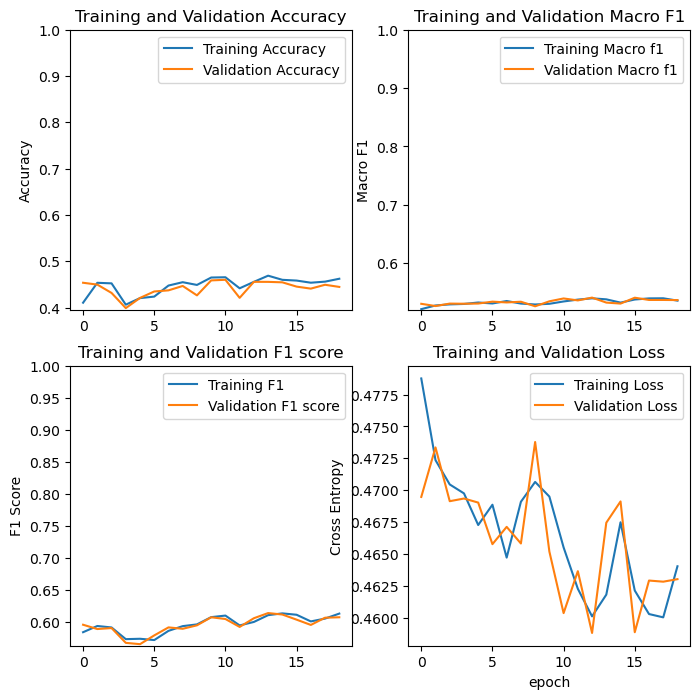

In [29]:
plot_accuracy_and_loss(history_vgg19)

In [37]:
model.save('./models/pre_trained_model_vgg19_no_tunining_MACRO_20ep_lr2.h5')
#model_loaded_vgg19 = tf.keras.models.load_model('./pre_trained_model_vgg19_no_tunining_custom_20ep_lr2.h5', compile=False)
#model_loaded_vgg19.compile(
#    optimizer=tf.keras.optimizers.Adam(learning_rate=2e-4),
#    loss=#macro_soft_f1,
    #tf.keras.metrics.binary_crossentropy,
#    custom_loss,
#  metrics=['accuracy',macro_f1, f1_score])


#model_loaded_vgg19.evaluate(test_ds)
model.evaluate(test_ds)

 53/188 [=======>......................] - ETA: 26s - loss: 0.4621 - accuracy: 0.4478 - macro_f1: 0.5378 - f1_score: 0.6106

KeyboardInterrupt: 

Img to array
Expand
[[1. 1. 1. 1. 1. 1. 1. 0. 1.]]


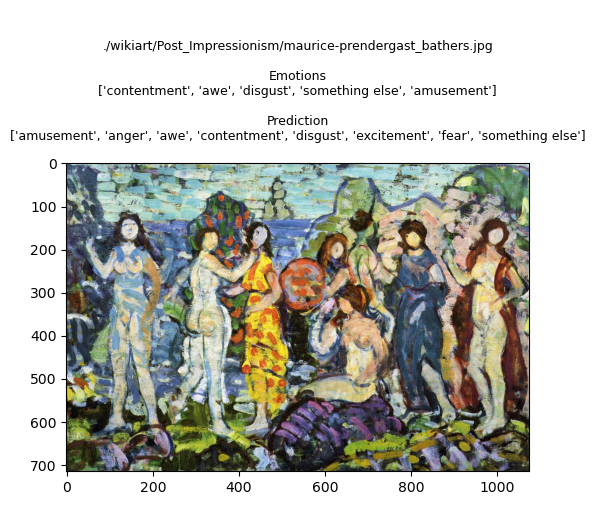

Img to array
Expand
[[1. 1. 1. 1. 1. 1. 1. 1. 1.]]


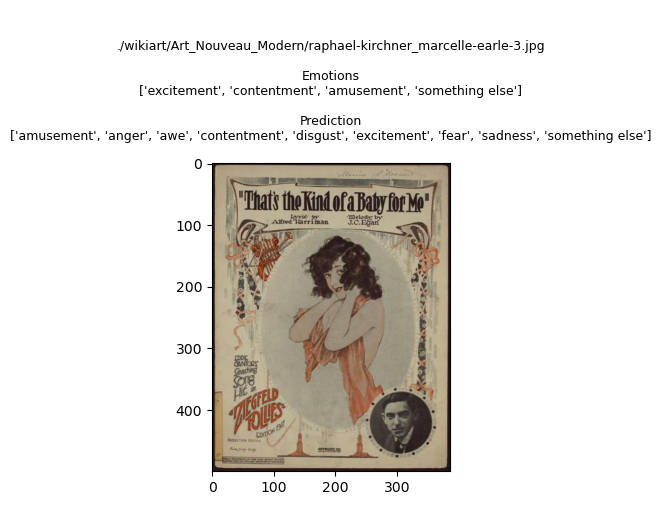

Img to array
Expand
[[1. 0. 1. 1. 1. 0. 1. 1. 1.]]


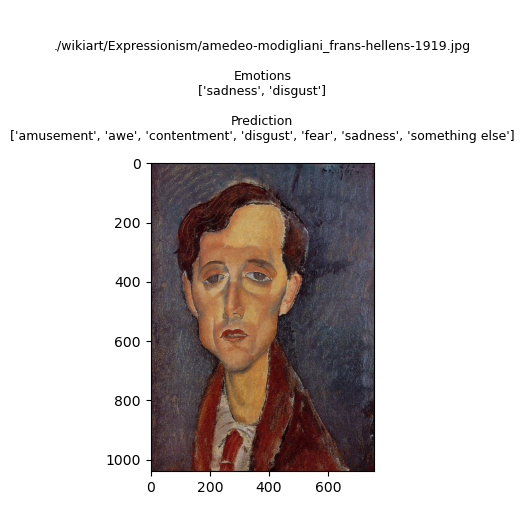

In [35]:
index = 3333
for i, path in enumerate(X_test[index:]):
    if i > 2:
        break

    show_prediction(path, y_test[index+i], model)#model_loaded_vgg19)

#### Fine Tuning VGG19

In [25]:
model_finetune_vgg19 = tf.keras.models.load_model('./models/pre_trained_model_vgg19_no_tunining_custom_20ep_lr2.h5', compile=False)
LR = 2e-4
model_finetune_vgg19.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 tf.__operators__.getitem (S  (None, 224, 224, 3)      0         
 licingOpLambda)                                                 
                                                                 
 tf.nn.bias_add (TFOpLambda)  (None, 224, 224, 3)      0         
                                                                 
 vgg19 (Functional)          (None, 7, 7, 512)         20024384  
                                                                 
 flatten (Flatten)           (None, 25088)             0         
                                                                 
 dense (Dense)               (None, 512)               12845568  
                                                             

In [26]:
model_finetune_vgg19.trainable = True

base_model_vgg19 = model_finetune_vgg19.get_layer("vgg19") # change the name looking at the summary IMPORTANT!
print("Number of layers in the base model: ", len(base_model_vgg19.layers))
base_model_vgg19.summary()

Number of layers in the base model:  22
Model: "vgg19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPool

In [27]:
set_trainable = False
for layer in base_model_vgg19.layers:
    if layer.name == 'block3_conv1': # è buona pratica indicare da dove si parte a sfreezare la rete
        set_trainable = True
    if set_trainable: # fine a che la variabile booleana è a False allora setto i layer non traininabili altrimenti li setto come trainabili
        layer.trainable = True
    else:
        layer.trainable = False

model_finetune_vgg19.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 tf.__operators__.getitem (S  (None, 224, 224, 3)      0         
 licingOpLambda)                                                 
                                                                 
 tf.nn.bias_add (TFOpLambda)  (None, 224, 224, 3)      0         
                                                                 
 vgg19 (Functional)          (None, 7, 7, 512)         20024384  
                                                                 
 flatten (Flatten)           (None, 25088)             0         
                                                                 
 dense (Dense)               (None, 512)               12845568  
                                                             

In [28]:
earlystopping = EarlyStopping(monitor='val_loss', mode='min', patience=6, verbose=1)

checkpoint = ModelCheckpoint('./models/pre_trained_model_fine_tunining_vgg19_custom_20ep.h5',   # I save in the older Keras H5 format due to a Tensorflow 2.7 bug
        monitor='val_loss', mode='min', verbose=1, 
        save_best_only=True, save_freq='epoch'
)

model_finetune_vgg19.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=LR),
    loss=#macro_soft_f1,
    #tf.keras.metrics.binary_crossentropy,
    custom_loss,
  metrics=['accuracy',macro_f1, f1_score]
)

In [30]:
history_tuned_vgg19 = model_finetune_vgg19.fit(train_ds,
                        epochs= 20,
                        batch_size=64,
                        validation_data=val_ds,
                        verbose=1,
                        callbacks=[checkpoint, earlystopping])

Epoch 1/20
876/876 [==============================] - ETA: 0s - loss: 7.1401 - accuracy: 0.1781 - macro_f1: 0.4305 - f1_score: 0.5888
Epoch 00001: val_loss improved from inf to 7.27259, saving model to ./models\pre_trained_model_fine_tunining_vgg19_custom_20ep.h5
876/876 [==============================] - 396s 440ms/step - loss: 7.1401 - accuracy: 0.1781 - macro_f1: 0.4305 - f1_score: 0.5888 - val_loss: 7.2726 - val_accuracy: 0.1734 - val_macro_f1: 0.4656 - val_f1_score: 0.5946
Epoch 2/20
876/876 [==============================] - ETA: 0s - loss: 7.0866 - accuracy: 0.1776 - macro_f1: 0.4284 - f1_score: 0.5899
Epoch 00002: val_loss improved from 7.27259 to 7.15788, saving model to ./models\pre_trained_model_fine_tunining_vgg19_custom_20ep.h5
876/876 [==============================] - 381s 434ms/step - loss: 7.0866 - accuracy: 0.1776 - macro_f1: 0.4284 - f1_score: 0.5899 - val_loss: 7.1579 - val_accuracy: 0.1734 - val_macro_f1: 0.4654 - val_f1_score: 0.5945
Epoch 3/20
876/876 [==========

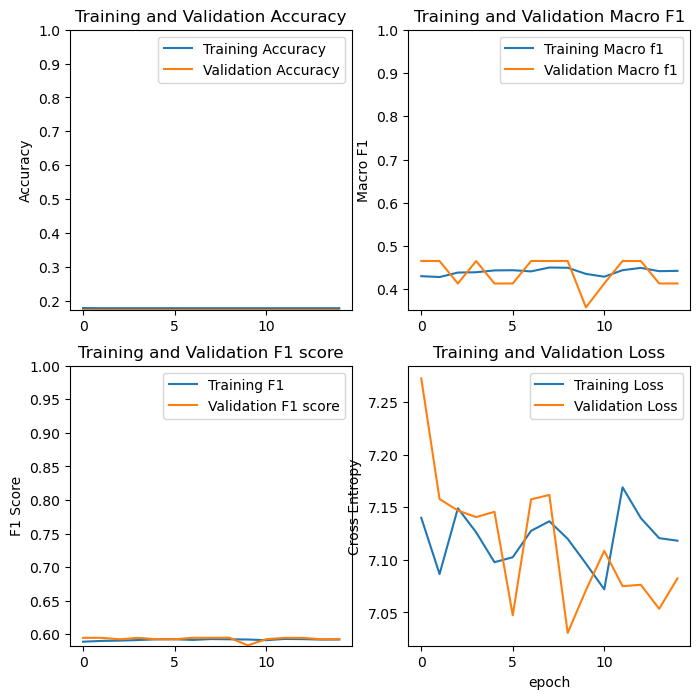

In [31]:
plot_accuracy_and_loss(history_tuned_vgg19)

In [33]:
model_tuned_loaded_vgg19 = tf.keras.models.load_model('./models/pre_trained_model_fine_tunining_vgg19_custom_20ep.h5', compile=False)
model_tuned_loaded_vgg19.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=LR),
    loss=#macro_soft_f1,
    #tf.keras.metrics.binary_crossentropy,
    custom_loss,
  metrics=['accuracy',macro_f1, f1_score])


model_tuned_loaded_vgg19.evaluate(test_ds)

188/188 [==============================] - 39s 202ms/step - loss: 7.1787 - accuracy: 0.1760 - macro_f1: 0.4648 - f1_score: 0.5936


[7.178709983825684,
 0.17600999772548676,
 0.4648466408252716,
 0.5935533046722412]

[[0.5859323  0.18639933 0.6957781  0.8162495  0.40663797 0.5306944
  0.50517756 0.56361765 0.6508163 ]]


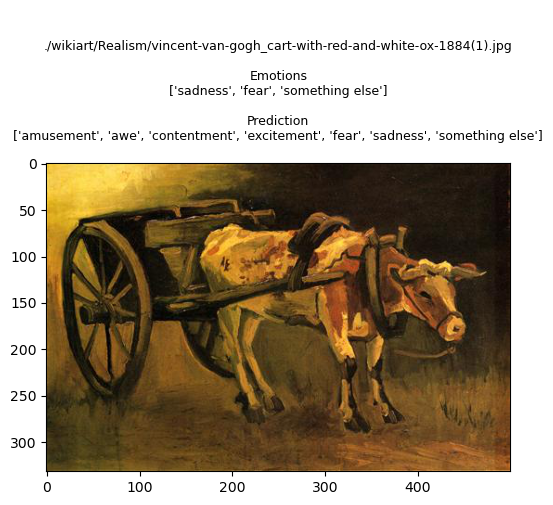

[[0.58593214 0.18639983 0.6957777  0.816249   0.40663815 0.5306943
  0.5051775  0.56361747 0.65081596]]


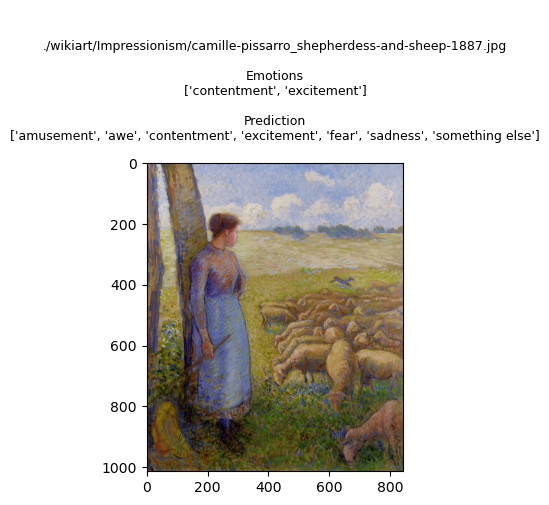

[[0.58593196 0.18640032 0.69577736 0.81624854 0.40663838 0.5306942
  0.50517756 0.56361735 0.65081567]]


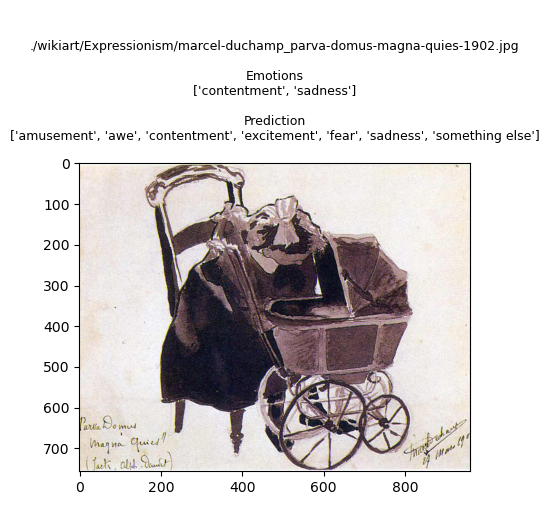

In [37]:
index = 5214
for i, path in enumerate(X_test[index:]):
    if i > 2:
        break

    show_prediction(path, y_test[index+i], model_tuned_loaded_vgg19)

### Xception

#### Freezed Model Xception

In [ ]:
INPUT_SHAPE = (IMG_SIZE, IMG_SIZE, 3)
base_model = tf.keras.applications.xception.Xception(input_shape=INPUT_SHAPE,
        weights='imagenet',  # load the network pretrained on ImageNet1K
        include_top=False)

base_model.trainable = False

print('Number of layers Xception: ', len(base_model.layers))
base_model.summary()

In [ ]:
inputs = tf.keras.Input(shape=INPUT_SHAPE)
x = tf.keras.applications.vgg19.preprocess_input(inputs)
x = base_model(x)
x = layers.Flatten()(x)
x = layers.Dense(512)(x)
x = layers.Dropout(0.2)(x)
outputs = layers.Dense(N_LABELS, activation="sigmoid")(x)
model = tf.keras.Model(inputs, outputs)

model.summary()

In [27]:
earlystopping = EarlyStopping(monitor='val_loss', mode='min', patience=10, verbose=1)

checkpoint = ModelCheckpoint('./models/pre_trained_model_xception_no_tunining_custom_20ep_lr1e-5.h5',   # I save in the older Keras H5 format due to a Tensorflow 2.7 bug
        monitor='val_loss', mode='min', verbose=1, 
        save_best_only=True, save_freq='epoch'
)

model.compile(
    optimizer=tf.keras.optimizers.RMSprop(learning_rate=1e-6), #tf.keras.optimizers.Adam(learning_rate=2e-4),
    loss=#macro_soft_f1,
        #tf.keras.metrics.binary_crossentropy,
        custom_loss,
  metrics=['accuracy',macro_f1, f1_score])

In [28]:
history_xception = model.fit(train_ds,
                        epochs= 30,
                        batch_size=64,
                        validation_data=val_ds,
                        verbose=1,
                        callbacks=[earlystopping])

Epoch 1/30
876/876 [==============================] - 185s 202ms/step - loss: 30.8923 - accuracy: 0.1491 - macro_f1: 0.4364 - f1_score: 0.5000 - val_loss: 23.0034 - val_accuracy: 0.1736 - val_macro_f1: 0.4493 - val_f1_score: 0.5397
Epoch 2/30
876/876 [==============================] - 174s 199ms/step - loss: 26.8245 - accuracy: 0.1758 - macro_f1: 0.4405 - f1_score: 0.5231 - val_loss: 21.3449 - val_accuracy: 0.1742 - val_macro_f1: 0.4469 - val_f1_score: 0.5399
Epoch 3/30
343/876 [==========>...................] - ETA: 1:28 - loss: 26.3797 - accuracy: 0.1733 - macro_f1: 0.4404 - f1_score: 0.5212

KeyboardInterrupt: 

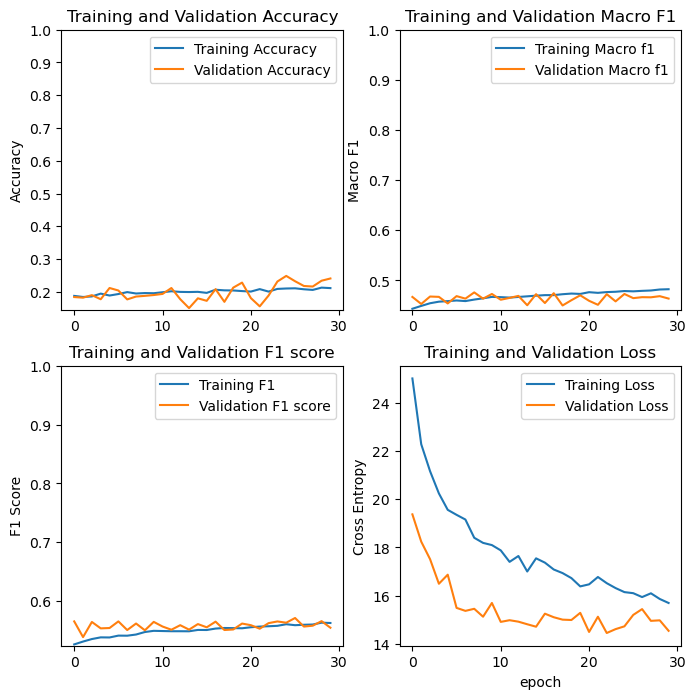

In [29]:
plot_accuracy_and_loss(history_xception)

In [37]:
#model.save('./models/pre_trained_model_xception_no_tunining_custom_20ep_lr1e-6.h5')
model_loaded_xception = tf.keras.models.load_model('./models/pre_trained_model_xception_no_tunining_custom_20ep_lr1e-6.h5', compile=False)
model_loaded_xception.compile(
    optimizer=tf.keras.optimizers.RMSprop(learning_rate=1e-6), #tf.keras.optimizers.Adam(learning_rate=2e-4),tf.keras.optimizers.Adam(learning_rate=2e-4),
    loss=#macro_soft_f1,
    #tf.keras.metrics.binary_crossentropy,
    custom_loss,
  metrics=['accuracy',macro_f1, f1_score])


model_loaded_xception.evaluate(test_ds)

188/188 [==============================] - 31s 158ms/step - loss: 14.0716 - accuracy: 0.2444 - macro_f1: 0.4630 - f1_score: 0.5553


[14.071633338928223,
 0.24439816176891327,
 0.46297407150268555,
 0.5553280115127563]

Img to array
Expand
[[0.97881913 0.1896723  0.9813141  0.9474081  0.5425558  0.7837792
  0.5385313  0.9362183  0.93325746]]


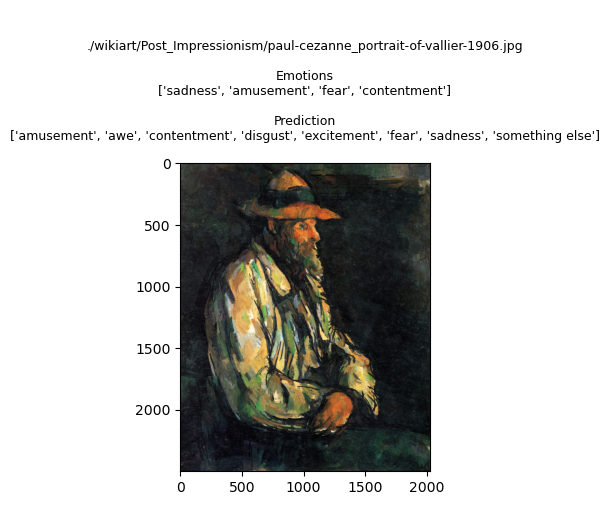

Img to array
Expand
[[0.9122144  0.07604536 0.9930026  0.53958756 0.20702764 0.98752755
  0.07497189 0.30644667 0.8758207 ]]


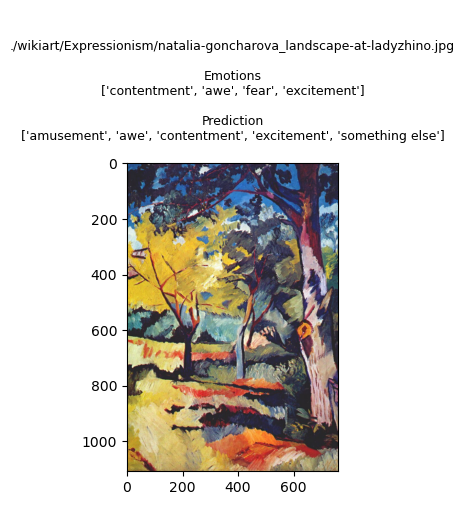

Img to array
Expand
[[9.9703938e-01 2.1910336e-04 7.5917524e-01 9.9998116e-01 5.9583396e-01
  9.2705834e-01 3.2201946e-02 9.8317218e-01 9.7393125e-01]]


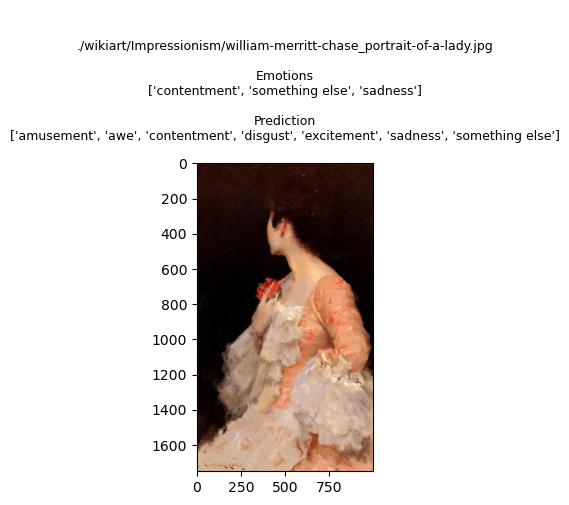

In [38]:
index = 7536
for i, path in enumerate(X_test[index:]):
    if i > 2:
        break

    show_prediction(path, y_test[index+i], model_loaded_xception)

#### Fine Tuning Xception


In [25]:
model_finetune = tf.keras.models.load_model('./models/pre_trained_model_xception_no_tunining_custom_20ep_lr1e-6.h5', compile=False)
LR = 1e-6
model_finetune.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 tf.__operators__.getitem (S  (None, 224, 224, 3)      0         
 licingOpLambda)                                                 
                                                                 
 tf.nn.bias_add (TFOpLambda)  (None, 224, 224, 3)      0         
                                                                 
 xception (Functional)       (None, 7, 7, 2048)        20861480  
                                                                 
 flatten (Flatten)           (None, 100352)            0         
                                                                 
 dense (Dense)               (None, 512)               51380736  
                                                             

In [26]:
model_finetune.trainable = True

base_model_xcept = model_finetune.get_layer("xception") # change the name looking at the summary IMPORTANT!
print("Number of layers in the base model: ", len(base_model_xcept.layers))
base_model_xcept.summary()

Number of layers in the base model:  132
Model: "xception"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 111, 111, 32  864         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv1_bn (BatchNormaliz  (None, 111, 111, 32  128        ['block1_conv1[0][0]']           
 ation)                         )                 

In [27]:

set_trainable = False
for layer in base_model_xcept.layers:
    if layer.name == 'block11_sepconv1_act': # è buona pratica indicare da dove si parte a sfreezare la rete
        set_trainable = True
    if set_trainable: # fine a che la variabile booleana è a False allora setto i layer non traininabili altrimenti li setto come trainabili
        if layer.name.endswith('bn'):
            print(layer.name)
            layer.trainable = False
        else:
            layer.trainable = True
    else:
        layer.trainable = False

model_finetune.summary()

block11_sepconv1_bn
block11_sepconv2_bn
block11_sepconv3_bn
block12_sepconv1_bn
block12_sepconv2_bn
block12_sepconv3_bn
block13_sepconv1_bn
block13_sepconv2_bn
block14_sepconv1_bn
block14_sepconv2_bn
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 tf.__operators__.getitem (S  (None, 224, 224, 3)      0         
 licingOpLambda)                                                 
                                                                 
 tf.nn.bias_add (TFOpLambda)  (None, 224, 224, 3)      0         
                                                                 
 xception (Functional)       (None, 7, 7, 2048)        20861480  
                                                                 
 flatten (Flatten)           (None, 100352)            0   

In [45]:
earlystopping = EarlyStopping(monitor='val_loss', mode='min', patience=10, verbose=1)

checkpoint = ModelCheckpoint('./pre_trained_model_fine_tunining_custom_20ep.h5',   # I save in the older Keras H5 format due to a Tensorflow 2.7 bug
        monitor='val_loss', mode='min', verbose=1, 
        save_best_only=True, save_freq='epoch'
)

model_finetune.compile(
    optimizer=tf.keras.optimizers.RMSprop(learning_rate=LR),
    loss=#macro_soft_f1,
    tf.keras.metrics.binary_crossentropy,
    #custom_loss,
  metrics=['accuracy',macro_f1, f1_score]
)

In [46]:
history_tuned_xcept = model_finetune.fit(train_ds,
                        epochs= 40,
                        batch_size=64,
                        validation_data=val_ds,
                        verbose=1,
                        callbacks=[earlystopping])

plot_accuracy_and_loss(history_tuned_xcept)

Epoch 1/40
876/876 [==============================] - 255s 289ms/step - loss: 0.5905 - accuracy: 0.1939 - macro_f1: 0.3321 - f1_score: 0.5326 - val_loss: 0.5887 - val_accuracy: 0.1769 - val_macro_f1: 0.2817 - val_f1_score: 0.5088
Epoch 2/40
876/876 [==============================] - 238s 271ms/step - loss: 0.5820 - accuracy: 0.1917 - macro_f1: 0.2901 - f1_score: 0.5110 - val_loss: 0.5863 - val_accuracy: 0.1774 - val_macro_f1: 0.2736 - val_f1_score: 0.5035
Epoch 3/40
876/876 [==============================] - 260s 296ms/step - loss: 0.5792 - accuracy: 0.1928 - macro_f1: 0.2878 - f1_score: 0.5093 - val_loss: 0.5851 - val_accuracy: 0.1792 - val_macro_f1: 0.2748 - val_f1_score: 0.5032
Epoch 4/40
417/876 [=============>................] - ETA: 1:52 - loss: 0.5769 - accuracy: 0.1942 - macro_f1: 0.2927 - f1_score: 0.5091

ResourceExhaustedError:  OOM when allocating tensor with shape[64,128,109,109] and type float on /job:localhost/replica:0/task:0/device:GPU:0 by allocator GPU_0_bfc
	 [[node model/xception/block2_sepconv1_bn/FusedBatchNormV3
 (defined at c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\layers\normalization\batch_normalization.py:605)
]]
Hint: If you want to see a list of allocated tensors when OOM happens, add report_tensor_allocations_upon_oom to RunOptions for current allocation info. This isn't available when running in Eager mode.
 [Op:__inference_train_function_177395]

Errors may have originated from an input operation.
Input Source operations connected to node model/xception/block2_sepconv1_bn/FusedBatchNormV3:
In[0] model/xception/block2_sepconv1/separable_conv2d (defined at c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\layers\convolutional.py:2253)	
In[1] model/xception/block2_sepconv1_bn/ReadVariableOp:	
In[2] model/xception/block2_sepconv1_bn/ReadVariableOp_1:	
In[3] model/xception/block2_sepconv1_bn/FusedBatchNormV3/ReadVariableOp:	
In[4] model/xception/block2_sepconv1_bn/FusedBatchNormV3/ReadVariableOp_1:

Operation defined at: (most recent call last)
>>>   File "c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\runpy.py", line 197, in _run_module_as_main
>>>     return _run_code(code, main_globals, None,
>>> 
>>>   File "c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\runpy.py", line 87, in _run_code
>>>     exec(code, run_globals)
>>> 
>>>   File "c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\ipykernel_launcher.py", line 17, in <module>
>>>     app.launch_new_instance()
>>> 
>>>   File "c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\traitlets\config\application.py", line 992, in launch_instance
>>>     app.start()
>>> 
>>>   File "c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\ipykernel\kernelapp.py", line 712, in start
>>>     self.io_loop.start()
>>> 
>>>   File "c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\tornado\platform\asyncio.py", line 215, in start
>>>     self.asyncio_loop.run_forever()
>>> 
>>>   File "c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\asyncio\base_events.py", line 601, in run_forever
>>>     self._run_once()
>>> 
>>>   File "c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\asyncio\base_events.py", line 1905, in _run_once
>>>     handle._run()
>>> 
>>>   File "c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\asyncio\events.py", line 80, in _run
>>>     self._context.run(self._callback, *self._args)
>>> 
>>>   File "c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\ipykernel\kernelbase.py", line 510, in dispatch_queue
>>>     await self.process_one()
>>> 
>>>   File "c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\ipykernel\kernelbase.py", line 499, in process_one
>>>     await dispatch(*args)
>>> 
>>>   File "c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\ipykernel\kernelbase.py", line 406, in dispatch_shell
>>>     await result
>>> 
>>>   File "c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\ipykernel\kernelbase.py", line 730, in execute_request
>>>     reply_content = await reply_content
>>> 
>>>   File "c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\ipykernel\ipkernel.py", line 383, in do_execute
>>>     res = shell.run_cell(
>>> 
>>>   File "c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\ipykernel\zmqshell.py", line 528, in run_cell
>>>     return super().run_cell(*args, **kwargs)
>>> 
>>>   File "c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\IPython\core\interactiveshell.py", line 2940, in run_cell
>>>     result = self._run_cell(
>>> 
>>>   File "c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\IPython\core\interactiveshell.py", line 2995, in _run_cell
>>>     return runner(coro)
>>> 
>>>   File "c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\IPython\core\async_helpers.py", line 129, in _pseudo_sync_runner
>>>     coro.send(None)
>>> 
>>>   File "c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\IPython\core\interactiveshell.py", line 3194, in run_cell_async
>>>     has_raised = await self.run_ast_nodes(code_ast.body, cell_name,
>>> 
>>>   File "c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\IPython\core\interactiveshell.py", line 3373, in run_ast_nodes
>>>     if await self.run_code(code, result, async_=asy):
>>> 
>>>   File "c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\IPython\core\interactiveshell.py", line 3433, in run_code
>>>     exec(code_obj, self.user_global_ns, self.user_ns)
>>> 
>>>   File "C:\Users\lioma\AppData\Local\Temp\ipykernel_2084\1126944512.py", line 1, in <module>
>>>     history_tuned_xcept = model_finetune.fit(train_ds,
>>> 
>>>   File "c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\utils\traceback_utils.py", line 64, in error_handler
>>>     return fn(*args, **kwargs)
>>> 
>>>   File "c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\engine\training.py", line 1216, in fit
>>>     tmp_logs = self.train_function(iterator)
>>> 
>>>   File "c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\engine\training.py", line 878, in train_function
>>>     return step_function(self, iterator)
>>> 
>>>   File "c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\engine\training.py", line 867, in step_function
>>>     outputs = model.distribute_strategy.run(run_step, args=(data,))
>>> 
>>>   File "c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\engine\training.py", line 860, in run_step
>>>     outputs = model.train_step(data)
>>> 
>>>   File "c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\engine\training.py", line 808, in train_step
>>>     y_pred = self(x, training=True)
>>> 
>>>   File "c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\utils\traceback_utils.py", line 64, in error_handler
>>>     return fn(*args, **kwargs)
>>> 
>>>   File "c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\engine\base_layer.py", line 1083, in __call__
>>>     outputs = call_fn(inputs, *args, **kwargs)
>>> 
>>>   File "c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\utils\traceback_utils.py", line 92, in error_handler
>>>     return fn(*args, **kwargs)
>>> 
>>>   File "c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\engine\functional.py", line 451, in call
>>>     return self._run_internal_graph(
>>> 
>>>   File "c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\engine\functional.py", line 589, in _run_internal_graph
>>>     outputs = node.layer(*args, **kwargs)
>>> 
>>>   File "c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\utils\traceback_utils.py", line 64, in error_handler
>>>     return fn(*args, **kwargs)
>>> 
>>>   File "c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\engine\base_layer.py", line 1083, in __call__
>>>     outputs = call_fn(inputs, *args, **kwargs)
>>> 
>>>   File "c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\utils\traceback_utils.py", line 92, in error_handler
>>>     return fn(*args, **kwargs)
>>> 
>>>   File "c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\engine\functional.py", line 451, in call
>>>     return self._run_internal_graph(
>>> 
>>>   File "c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\engine\functional.py", line 589, in _run_internal_graph
>>>     outputs = node.layer(*args, **kwargs)
>>> 
>>>   File "c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\utils\traceback_utils.py", line 64, in error_handler
>>>     return fn(*args, **kwargs)
>>> 
>>>   File "c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\engine\base_layer.py", line 1083, in __call__
>>>     outputs = call_fn(inputs, *args, **kwargs)
>>> 
>>>   File "c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\utils\traceback_utils.py", line 92, in error_handler
>>>     return fn(*args, **kwargs)
>>> 
>>>   File "c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\layers\normalization\batch_normalization.py", line 767, in call
>>>     outputs = self._fused_batch_norm(inputs, training=training)
>>> 
>>>   File "c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\layers\normalization\batch_normalization.py", line 623, in _fused_batch_norm
>>>     output, mean, variance = control_flow_util.smart_cond(
>>> 
>>>   File "c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\utils\control_flow_util.py", line 105, in smart_cond
>>>     return tf.__internal__.smart_cond.smart_cond(
>>> 
>>>   File "c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\layers\normalization\batch_normalization.py", line 605, in _fused_batch_norm_inference
>>>     return tf.compat.v1.nn.fused_batch_norm(
>>> 

In [32]:
#model_finetune.save('./models/pre_trained_model_xcpetion_fine_tunining_custom_40ep_lr1-6.h5')
model_tuned_loaded = tf.keras.models.load_model('./models/pre_trained_model_xcpetion_fine_tunining_custom_40ep_lr1-6.h5', compile=False)
model_tuned_loaded.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=LR),
    loss=#macro_soft_f1,
    #tf.keras.metrics.binary_crossentropy,
    custom_loss,
  metrics=['accuracy',macro_f1, f1_score])


model_tuned_loaded.evaluate(test_ds)

188/188 [==============================] - 31s 156ms/step - loss: 7.0145 - accuracy: 0.1794 - macro_f1: 0.4667 - f1_score: 0.6013


[7.014519214630127,
 0.17942523956298828,
 0.4667370021343231,
 0.6012824773788452]

Img to array
Expand
[[0.45291954 0.09359529 0.7418519  0.7881972  0.44424194 0.3945689
  0.55964977 0.5276401  0.66100955]]


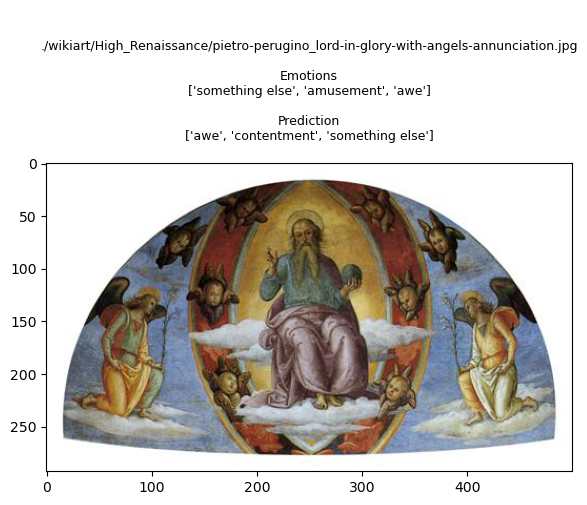

Img to array
Expand
[[0.57681125 0.09409871 0.8514255  0.8602315  0.23115772 0.23225603
  0.6287484  0.65269667 0.6072078 ]]


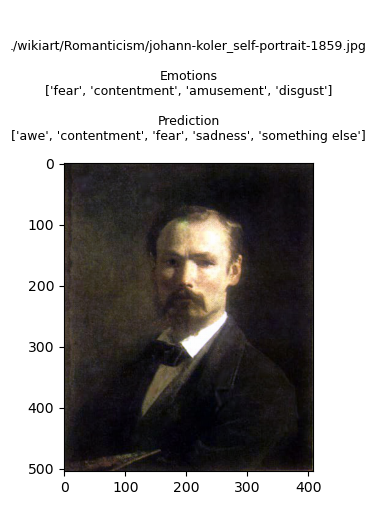

Img to array
Expand
[[0.59590846 0.1526636  0.7598671  0.8635843  0.45009327 0.5850046
  0.4672574  0.52593726 0.6353142 ]]


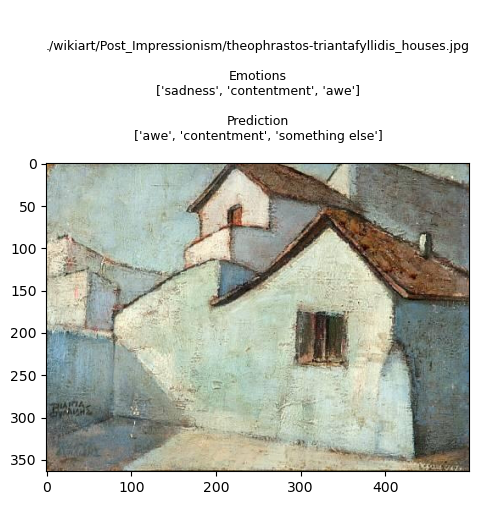

In [43]:
index = 3563
for i, path in enumerate(X_test[index:]):
    if i > 2:
        break

    show_prediction(path, y_test[index+i], model_tuned_loaded)

### MobileNet

#### Freezed model MobileNet

In [25]:
INPUT_SHAPE = (IMG_SIZE, IMG_SIZE, 3)
base_model_mob = tf.keras.applications.mobilenet_v2.MobileNetV2(
        input_shape=INPUT_SHAPE,
        weights='imagenet',  # load the network pretrained on ImageNet1K
        include_top=False)

base_model_mob.trainable = False

print('Number of layers Xception: ', len(base_model_mob.layers))
base_model_mob.summary()

Number of layers Xception:  154
Model: "mobilenetv2_1.00_224"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 112, 112, 32  864         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 112, 112, 32  128         ['Conv1[0][0]']                  
                                )              

In [26]:
inputs = tf.keras.Input(shape=INPUT_SHAPE)
x = tf.keras.applications.mobilenet_v2.preprocess_input(inputs)
x = base_model_mob(x)
x = layers.GlobalAveragePooling2D()(x)
#x = layers.Flatten()(x)

x = layers.Dense(512, activation='relu')(x)
x = layers.Dropout(0.3)(x)
outputs = layers.Dense(N_LABELS, activation="sigmoid")(x)
model = tf.keras.Model(inputs, outputs)

model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 tf.math.truediv (TFOpLambda  (None, 224, 224, 3)      0         
 )                                                               
                                                                 
 tf.math.subtract (TFOpLambd  (None, 224, 224, 3)      0         
 a)                                                              
                                                                 
 mobilenetv2_1.00_224 (Funct  (None, 7, 7, 1280)       2257984   
 ional)                                                          
                                                                 
 global_average_pooling2d (G  (None, 1280)             0         
 lobalAveragePooling2D)                                      

In [27]:
earlystopping = EarlyStopping(monitor='val_loss', mode='min', patience=10, verbose=1)

checkpoint = ModelCheckpoint('./models/pre_trained_model_mobilev2_no_tunining_MACRO_40ep_lr1e-5.h5',   # I save in the older Keras H5 format due to a Tensorflow 2.7 bug
        monitor='val_loss', mode='min', verbose=1, 
        save_best_only=True, save_freq='epoch'
)

model.compile(
    optimizer=tf.keras.optimizers.RMSprop(learning_rate=1e-5), #tf.keras.optimizers.Adam(learning_rate=2e-4),
    loss=macro_soft_f1,
        #tf.keras.metrics.binary_crossentropy,
        #custom_loss,
  metrics=['accuracy',macro_f1, f1_score])

Epoch 1/40
876/876 [==============================] - ETA: 0s - loss: 0.4915 - accuracy: 0.1859 - macro_f1: 0.5150 - f1_score: 0.5652
Epoch 00001: val_loss improved from inf to 0.47834, saving model to ./models\pre_trained_model_mobilev2_no_tunining_MACRO_40ep_lr1e-5.h5
876/876 [==============================] - 147s 158ms/step - loss: 0.4915 - accuracy: 0.1859 - macro_f1: 0.5150 - f1_score: 0.5652 - val_loss: 0.4783 - val_accuracy: 0.1979 - val_macro_f1: 0.5248 - val_f1_score: 0.5728
Epoch 2/40


c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\engine\functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


875/876 [============================>.] - ETA: 0s - loss: 0.4767 - accuracy: 0.1913 - macro_f1: 0.5260 - f1_score: 0.5764
Epoch 00002: val_loss improved from 0.47834 to 0.47249, saving model to ./models\pre_trained_model_mobilev2_no_tunining_MACRO_40ep_lr1e-5.h5
876/876 [==============================] - 133s 152ms/step - loss: 0.4767 - accuracy: 0.1913 - macro_f1: 0.5260 - f1_score: 0.5764 - val_loss: 0.4725 - val_accuracy: 0.1830 - val_macro_f1: 0.5309 - val_f1_score: 0.5804
Epoch 3/40
875/876 [============================>.] - ETA: 0s - loss: 0.4708 - accuracy: 0.1852 - macro_f1: 0.5331 - f1_score: 0.5870
Epoch 00003: val_loss improved from 0.47249 to 0.46851, saving model to ./models\pre_trained_model_mobilev2_no_tunining_MACRO_40ep_lr1e-5.h5
876/876 [==============================] - 136s 155ms/step - loss: 0.4708 - accuracy: 0.1852 - macro_f1: 0.5330 - f1_score: 0.5870 - val_loss: 0.4685 - val_accuracy: 0.1732 - val_macro_f1: 0.5345 - val_f1_score: 0.5892
Epoch 4/40
875/876 [===

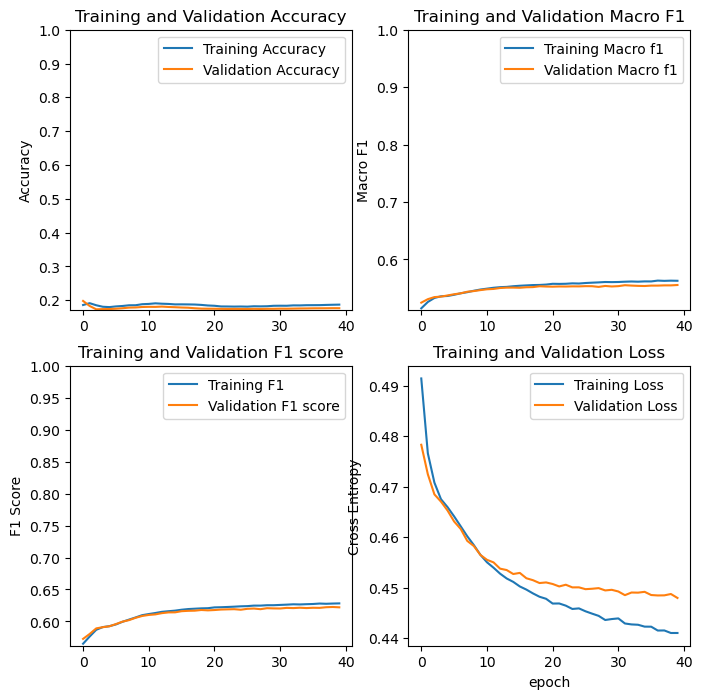

In [28]:
history_mob = model.fit(train_ds,
                        epochs= 40,
                        batch_size=64,
                        validation_data=val_ds,
                        verbose=1,
                        callbacks=[earlystopping, checkpoint])

plot_accuracy_and_loss(history_mob)

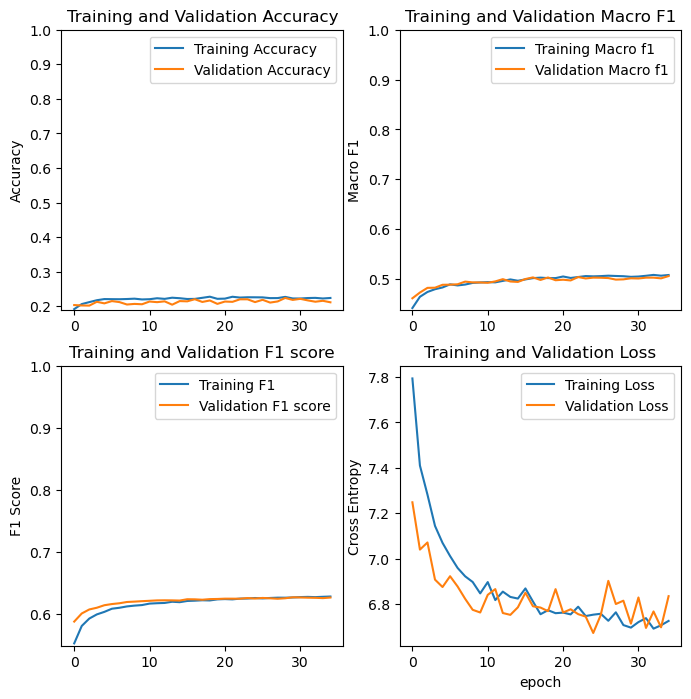

In [56]:
plot_accuracy_and_loss(history_mob)

In [29]:
#model.save('./models/pre_trained_model_mobilev2_no_tunining_MACRO_40ep_lr1e-5_VERSIONULTIMA.h5')
model_loaded_mob = tf.keras.models.load_model('./models/pre_trained_model_mobilev2_no_tunining_MACRO_40ep_lr1e-5.h5', compile=False)
model_loaded_mob.compile(
    optimizer=tf.keras.optimizers.RMSprop(learning_rate=1e-5), #tf.keras.optimizers.Adam(learning_rate=2e-4),tf.keras.optimizers.Adam(learning_rate=2e-4),
    loss=macro_soft_f1,
    #tf.keras.metrics.binary_crossentropy,
    #custom_loss,
  metrics=['accuracy',macro_f1, f1_score, tf.keras.metrics.Precision(), tf.keras.metrics.Recall()])


model_loaded_mob.evaluate(test_ds)


188/188 [==============================] - 24s 119ms/step - loss: 0.4484 - accuracy: 0.1796 - macro_f1: 0.5536 - f1_score: 0.6227 - precision: 0.4809 - recall: 0.8839


[0.44835543632507324,
 0.1795918345451355,
 0.5535839796066284,
 0.6226586699485779,
 0.4808849096298218,
 0.8838543891906738]

In [ ]:
#model.evaluate(test_ds)

Img to array
Expand
[[2.6672041e-01 6.0911611e-07 9.9996030e-01 1.0000000e+00 6.6613114e-01
  9.5867592e-01 1.0092195e-04 9.7690839e-01 9.9943632e-01]]


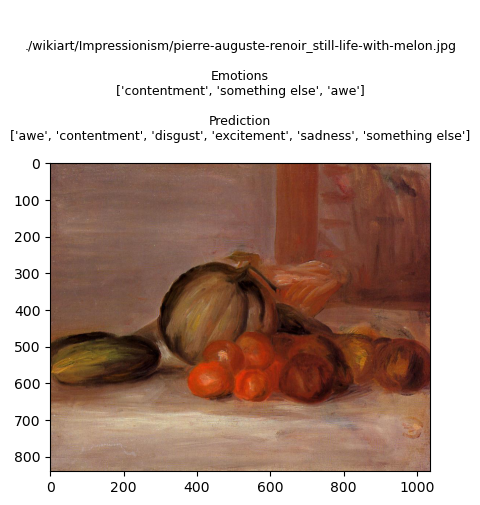

Img to array
Expand
[[9.9998975e-01 1.1315584e-06 9.9999845e-01 1.0000000e+00 9.9799180e-01
  9.9999630e-01 3.5687670e-01 9.7330099e-01 9.9999774e-01]]


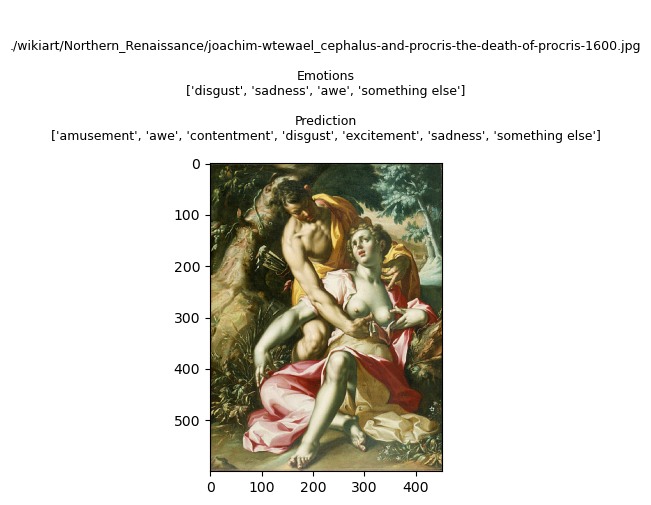

Img to array
Expand
[[7.8555316e-01 4.8945716e-04 9.9997938e-01 1.0000000e+00 1.9021176e-01
  4.7766721e-01 9.9702090e-01 9.9988568e-01 9.9996853e-01]]


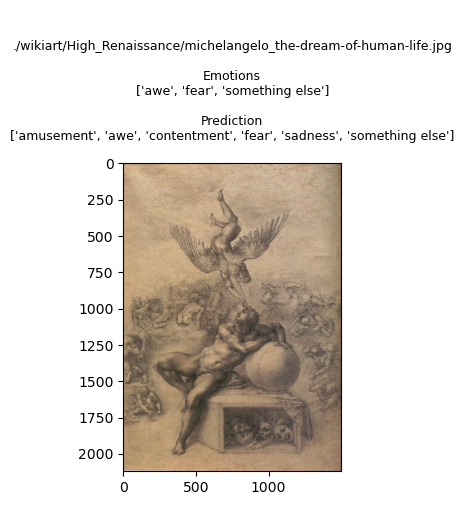

In [34]:
index = 566
for i, path in enumerate(X_test[index:]):
    if i > 2:
        break

    show_prediction(path, y_test[index+i], model_loaded_mob)

#### Fine Tuning MobileNet

In [ ]:
### DA COMPLETARE

### Inception V3

#### Freezed Model InceptionV3

In [25]:
INPUT_SHAPE = (IMG_SIZE, IMG_SIZE, 3)
base_model_incv3 = tf.keras.applications.inception_v3.InceptionV3(
        input_shape=INPUT_SHAPE,
        weights='imagenet',  # load the network pretrained on ImageNet1K
        include_top=False)

base_model_incv3.trainable = False

print('Number of layers InceptionV3: ', len(base_model_incv3.layers))
base_model_incv3.summary()

Number of layers InceptionV3:  311
Model: "inception_v3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 111, 111, 32  864         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 111, 111, 32  96         ['conv2d[0][0]']                 
 alization)                     )                   

In [26]:
inputs = tf.keras.Input(shape=INPUT_SHAPE)
x = tf.keras.applications.inception_v3.preprocess_input(inputs)
x = base_model_incv3(x)
x = layers.GlobalAveragePooling2D()(x)
#x = layers.Flatten()(x)

x = layers.Dense(512, activation='relu')(x)
x = layers.Dropout(0.3)(x)
outputs = layers.Dense(N_LABELS, activation="sigmoid")(x)
model_incv3 = tf.keras.Model(inputs, outputs)

model_incv3.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 tf.math.truediv (TFOpLambda  (None, 224, 224, 3)      0         
 )                                                               
                                                                 
 tf.math.subtract (TFOpLambd  (None, 224, 224, 3)      0         
 a)                                                              
                                                                 
 inception_v3 (Functional)   (None, 5, 5, 2048)        21802784  
                                                                 
 global_average_pooling2d (G  (None, 2048)             0         
 lobalAveragePooling2D)                                          
                                                             

In [27]:
earlystopping = EarlyStopping(monitor='val_loss', mode='min', patience=10, verbose=1)

checkpoint = ModelCheckpoint('./models/pre_trained_model_inceptionv3_no_tunining_custom_40ep_lr1e-5.h5',   # I save in the older Keras H5 format due to a Tensorflow 2.7 bug
        monitor='val_loss', mode='min', verbose=1, 
        save_best_only=True, save_freq='epoch'
)

model_incv3.compile(
    optimizer=tf.keras.optimizers.RMSprop(learning_rate=1e-5), #tf.keras.optimizers.Adam(learning_rate=2e-4),
    loss=#macro_soft_f1,
        #tf.keras.metrics.binary_crossentropy,
        custom_loss,
  metrics=['accuracy',macro_f1, f1_score])

Epoch 1/40
876/876 [==============================] - ETA: 0s - loss: 7.6545 - accuracy: 0.1922 - macro_f1: 0.4487 - f1_score: 0.5637
Epoch 00001: val_loss improved from inf to 7.14875, saving model to ./models\pre_trained_model_inceptionv3_no_tunining_custom_40ep_lr1e-5.h5
876/876 [==============================] - 160s 169ms/step - loss: 7.6545 - accuracy: 0.1922 - macro_f1: 0.4487 - f1_score: 0.5637 - val_loss: 7.1488 - val_accuracy: 0.1835 - val_macro_f1: 0.4668 - val_f1_score: 0.5959
Epoch 2/40
875/876 [============================>.] - ETA: 0s - loss: 7.2967 - accuracy: 0.1955 - macro_f1: 0.4697 - f1_score: 0.5896
Epoch 00002: val_loss improved from 7.14875 to 6.96158, saving model to ./models\pre_trained_model_inceptionv3_no_tunining_custom_40ep_lr1e-5.h5
876/876 [==============================] - 140s 159ms/step - loss: 7.2969 - accuracy: 0.1955 - macro_f1: 0.4698 - f1_score: 0.5896 - val_loss: 6.9616 - val_accuracy: 0.1869 - val_macro_f1: 0.4740 - val_f1_score: 0.6046
Epoch 3/

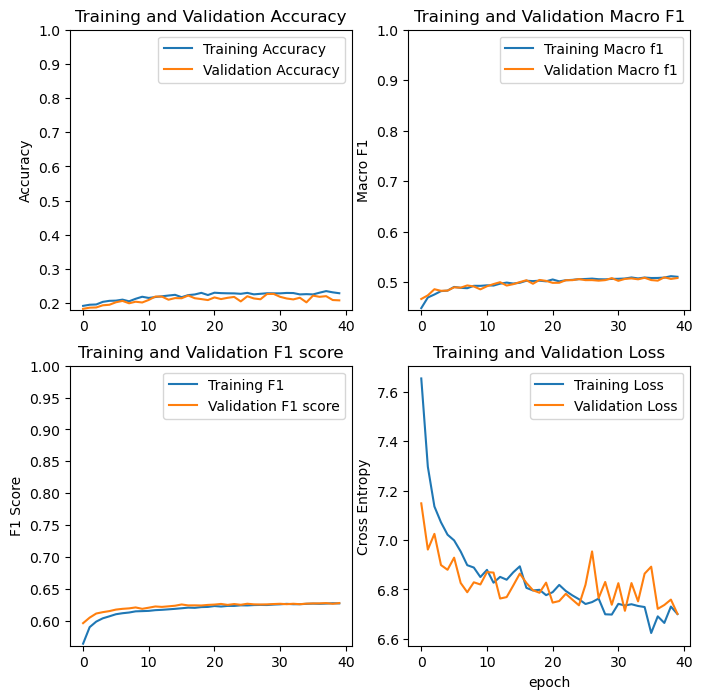

In [28]:
history_incv3 = model_incv3.fit(train_ds,
                        epochs= 40,
                        batch_size=64,
                        validation_data=val_ds,
                        verbose=1,
                        callbacks=[earlystopping, checkpoint])

plot_accuracy_and_loss(history_incv3)

In [29]:
#model.save('./models/pre_trained_model_mobilev2_no_tunining_MACRO_40ep_lr1e-5_VERSIONULTIMA.h5')
model_loaded_incv3 = tf.keras.models.load_model('./models/pre_trained_model_inceptionv3_no_tunining_custom_40ep_lr1e-5.h5', compile=False)
model_loaded_incv3.compile(
    optimizer=tf.keras.optimizers.RMSprop(learning_rate=1e-5), #tf.keras.optimizers.Adam(learning_rate=2e-4),tf.keras.optimizers.Adam(learning_rate=2e-4),
    loss=#macro_soft_f1,
    #tf.keras.metrics.binary_crossentropy,
    custom_loss,
  metrics=['accuracy',macro_f1, f1_score, tf.keras.metrics.Precision(), tf.keras.metrics.Recall()])


model_loaded_incv3.evaluate(test_ds)

188/188 [==============================] - 26s 127ms/step - loss: 6.7607 - accuracy: 0.2190 - macro_f1: 0.5075 - f1_score: 0.6270 - precision: 0.5201 - recall: 0.7899


[6.760679721832275,
 0.21899208426475525,
 0.5074670910835266,
 0.6269505023956299,
 0.5200618505477905,
 0.789894163608551]

Img to array
Expand
[[0.529055   0.08744626 0.66554713 0.93377316 0.23937872 0.43134695
  0.29452905 0.63707805 0.60515386]]


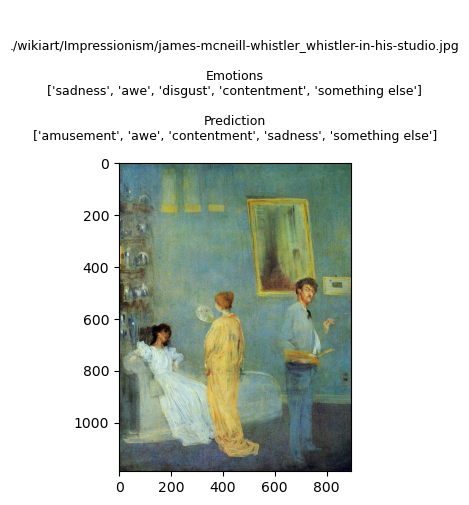

Img to array
Expand
[[0.5494672  0.20722023 0.861118   0.78062814 0.3320317  0.42086703
  0.66336775 0.6152341  0.6068754 ]]


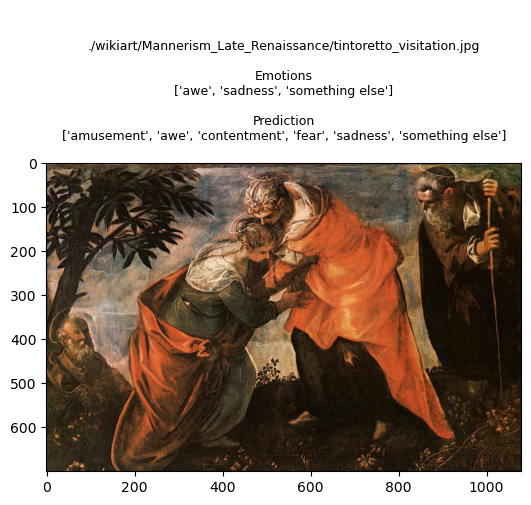

Img to array
Expand
[[0.2961687  0.11729737 0.7482197  0.8800508  0.27731538 0.6427464
  0.40520933 0.6116433  0.6231335 ]]


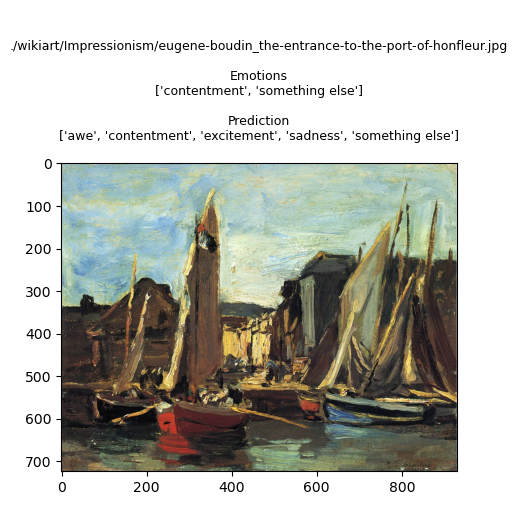

In [32]:
index = 7777
for i, path in enumerate(X_test[index:]):
    if i > 2:
        break

    show_prediction(path, y_test[index+i], model_loaded_incv3)

#### Fine Tuning InceptionV3

## Neural Style Transfer

In [8]:
import IPython.display as display
import matplotlib as mpl
import numpy as np
import PIL.Image
import time
import functools

os.environ['TFHUB_MODEL_LOAD_FORMAT'] = 'COMPRESSED'
mpl.rcParams['figure.figsize'] = (12, 12)
mpl.rcParams['axes.grid'] = False


In [9]:
def tensor_to_image(tensor):
  tensor = tensor*255
  tensor = np.array(tensor, dtype=np.uint8)
  if np.ndim(tensor)>3:
    assert tensor.shape[0] == 1
    tensor = tensor[0]
  return PIL.Image.fromarray(tensor)

In [10]:
file_style = './wikiart/Post_Impressionism/vincent-van-gogh_the-starry-night-1889(1).jpg'
file_transf = './wikiart/Realism/alekos-kontopoulos_portrait-of-eugenia-wife-of-kleomenis-tsitsaras.jpg'
#fullPath_style = os.path.abspath(file_style)
#fullPath_transf = os.path.abspath(file_transf)
#content_path = tf.keras.utils.get_file('alekos-kontopoulos_portrait-of-eugenia-wife-of-kleomenis-tsitsaras.jpg', 'file://'+fullPath_transf)
#style_path = tf.keras.utils.get_file('aristarkh-lentulov_self-portrait-1912.jpg','file://'+fullPath_style)

In [11]:
def load_img(path_to_img):
  max_dim = 512
  img = tf.io.read_file(path_to_img)
  img = tf.image.decode_image(img, channels=3)
  img = tf.image.convert_image_dtype(img, tf.float32)

  shape = tf.cast(tf.shape(img)[:-1], tf.float32)
  long_dim = max(shape)
  scale = max_dim / long_dim

  new_shape = tf.cast(shape * scale, tf.int32)

  img = tf.image.resize(img, new_shape)
  img = img[tf.newaxis, :]
  return img

def imshow(image, title=None):
  if len(image.shape) > 3:
    image = tf.squeeze(image, axis=0)

  plt.imshow(image)
  if title:
    plt.title(title)

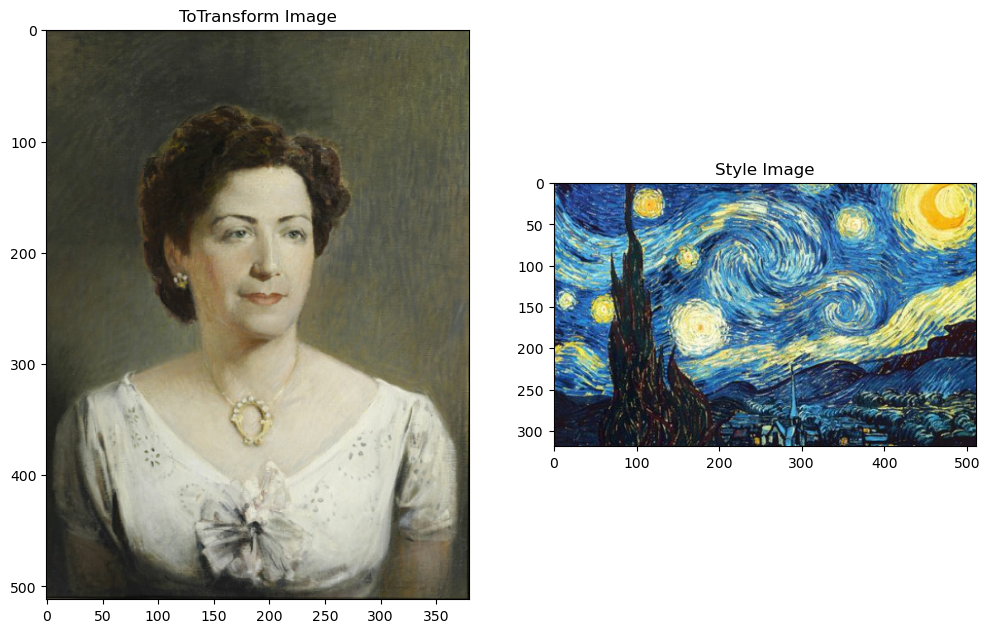

In [12]:
content_image = load_img(file_transf)
style_image = load_img(file_style)

plt.subplot(1, 2, 1)
imshow(content_image, 'ToTransform Image')

plt.subplot(1, 2, 2)
imshow(style_image, 'Style Image')

### Load Model

In [13]:
vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')

print()
for layer in vgg.layers:
  print(layer.name)


input_1
block1_conv1
block1_conv2
block1_pool
block2_conv1
block2_conv2
block2_pool
block3_conv1
block3_conv2
block3_conv3
block3_conv4
block3_pool
block4_conv1
block4_conv2
block4_conv3
block4_conv4
block4_pool
block5_conv1
block5_conv2
block5_conv3
block5_conv4
block5_pool


In [14]:
content_layers = ['block5_conv2'] 

style_layers = ['block1_conv1',
                'block2_conv1',
                'block3_conv1', 
                'block4_conv1', 
                'block5_conv1']

num_content_layers = len(content_layers)
num_style_layers = len(style_layers)


In [15]:
def vgg_layers(layer_names):
  vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')
  vgg.trainable = False

  outputs = [vgg.get_layer(name).output for name in layer_names]

  model = tf.keras.Model([vgg.input], outputs)
  return model

In [16]:
def gram_matrix(input_tensor):
  result = tf.linalg.einsum('bijc,bijd->bcd', input_tensor, input_tensor)
  input_shape = tf.shape(input_tensor)
  num_locations = tf.cast(input_shape[1]*input_shape[2], tf.float32)
  return result/(num_locations)

In [17]:
class StyleContentModel(tf.keras.models.Model): #super classe dei keras.mpdels
  def __init__(self, style_layers, content_layers):
    super(StyleContentModel, self).__init__()
    self.vgg = vgg_layers(style_layers + content_layers) #creo modello con layer intermedi
    self.style_layers = style_layers #salvo i nomi dei layer di stile e contenuto
    self.content_layers = content_layers
    self.num_style_layers = len(style_layers) #salvo solo il numero di layer di stile in quanto quelli contenuto è soltanto uno
    self.vgg.trainable = False #setto la rete non allenabile (questo sarà un parametro che si può cambiare)

  def call(self, inputs): #questa funzione viene passata quando in input ha un'immagine
    "Expects float input in [0,1]"
    inputs = inputs*255.0
    preprocessed_input = tf.keras.applications.vgg19.preprocess_input(inputs)
    outputs = self.vgg(preprocessed_input)
    style_outputs, content_outputs = (outputs[:self.num_style_layers], #recupero le features estratte dai layer di stile e dal layer di contenuto
                                      outputs[self.num_style_layers:])

    style_outputs = [gram_matrix(style_output) #uso la gramm matrix per correlare le varie features map dello stile
                     for style_output in style_outputs]

    content_dict = {content_name: value  #faccio una dict in modo che ad ogni layer posso associare le rispettive features estratte
                    for content_name, value
                    in zip(self.content_layers, content_outputs)}

    style_dict = {style_name: value
                  for style_name, value
                  in zip(self.style_layers, style_outputs)}

    return {'content': content_dict, 'style': style_dict}

In [18]:
extractor = StyleContentModel(style_layers, content_layers)

style_targets = extractor(style_image)['style']
content_targets = extractor(content_image)['content']

style_targets # in questo tensore sono presenti le features estratte per ogni layer
content_targets

{'block5_conv2': <tf.Tensor: shape=(1, 32, 23, 512), dtype=float32, numpy=
 array([[[[0.00000000e+00, 2.84696937e+00, 8.37339859e+01, ...,
           0.00000000e+00, 6.26427040e+01, 3.21475716e+01],
          [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
           0.00000000e+00, 5.94767227e+01, 0.00000000e+00],
          [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
           0.00000000e+00, 5.13529472e+01, 0.00000000e+00],
          ...,
          [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
           0.00000000e+00, 5.73962975e+01, 0.00000000e+00],
          [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
           0.00000000e+00, 4.25030785e+01, 0.00000000e+00],
          [0.00000000e+00, 4.63236475e+00, 0.00000000e+00, ...,
           0.00000000e+00, 2.37235394e+01, 0.00000000e+00]],
 
         [[0.00000000e+00, 8.33654327e+01, 1.35679611e+02, ...,
           0.00000000e+00, 4.40974426e+01, 4.74775391e+01],
          [1.34986019e+01, 3.82050591e+

In [19]:
image = tf.Variable(content_image)

In [20]:
def clip_0_1(image):
  return tf.clip_by_value(image, clip_value_min=0.0, clip_value_max=1.0)

In [21]:
style_weight=1e-2
content_weight=1e4
opt = tf.keras.optimizers.Adam(learning_rate=0.02, beta_1=0.99, epsilon=1e-1)

In [22]:
def style_content_loss(outputs):
    style_outputs = outputs['style']
    content_outputs = outputs['content']
    style_loss = tf.add_n([tf.reduce_mean((style_outputs[name]-style_targets[name])**2) 
                           for name in style_outputs.keys()])
    style_loss *= style_weight / num_style_layers

    content_loss = tf.add_n([tf.reduce_mean((content_outputs[name]-content_targets[name])**2) 
                             for name in content_outputs.keys()])
    content_loss *= content_weight / num_content_layers
    loss = style_loss + content_loss
    return loss

In [23]:
@tf.function()
def train_step(image):
  with tf.GradientTape() as tape:
    outputs = extractor(image)
    loss = style_content_loss(outputs)

  grad = tape.gradient(loss, image)
  opt.apply_gradients([(grad, image)])
  image.assign(clip_0_1(image))

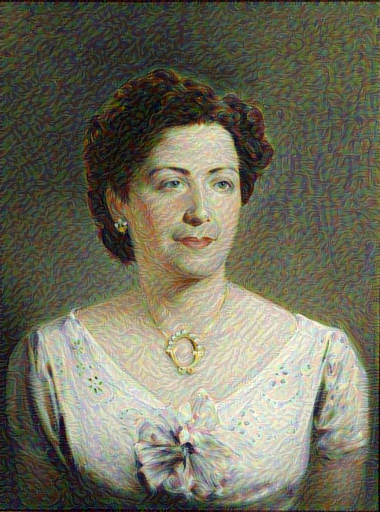

In [24]:
train_step(image)
train_step(image)
train_step(image)
tensor_to_image(image)

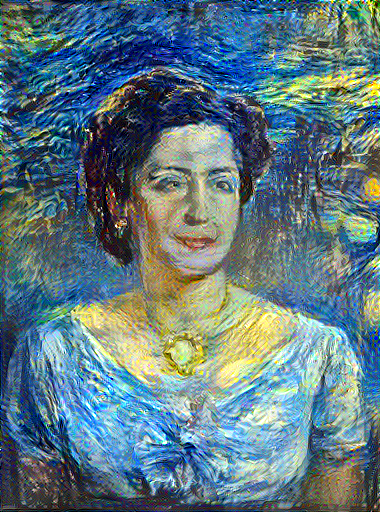

100%|██████████| 30/30 [02:17<00:00,  4.57s/it]

Train step: 3000
Total time: 137.0


In [25]:
import time
start = time.time()

epochs = 30
steps_per_epoch = 100

step = 0
for n in tqdm(range(epochs)):
  for m in tqdm(range(steps_per_epoch)):
    step += 1
    train_step(image)
    #print(".", end='', flush=True)
  display.clear_output(wait=True)
  display.display(tensor_to_image(image))
  print("Train step: {}".format(step))

end = time.time()
print("Total time: {:.1f}".format(end-start))

In [29]:
#file_name = './experiments_image/image_realism_van_gogh.png'
#tensor_to_image(image).save(file_name)

### CycleGAN


try to apply the same task but using an Generative Adversarial Network (GAN)